<a href="https://colab.research.google.com/github/KalyaniChikshe/fmcg-warehouse-optimization/blob/main/notebooks/fmcg_warehouse_optimization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip3 install pandas numpy matplotlib seaborn
!pip3 install mlxtend
!pip3 install ace_tools

### Importing Required Libraries

In this step, we import essential Python libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Optional for pretty plots
sns.set(style='whitegrid')


### Loading the Dataset

We load the FMCG dataset using `pandas.read_csv()` and display the first few rows with `.head()` to get an initial look at the structure and content of the data.


In [ ]:
# Load dataset
df = pd.read_csv('FMCG_data.csv')

# Display the first few rows
df.head()


,Ware_house_ID,WH_Manager_ID,Location_type,WH_capacity_size,zone,WH_regional_zone,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,...,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,approved_wh_govt_certificate,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,inventory_status
0,WH_100000,EID_50000,Urban,Small,West,Zone 6,3,1,2,4651,...,91,29.0,NaN,13,0,A,5,15,17115,0
1,WH_100001,EID_50001,Rural,Large,North,Zone 5,0,0,4,6217,...,210,31.0,NaN,4,0,A,3,17,5074,0
2,WH_100002,EID_50002,Rural,Mid,South,Zone 2,1,0,4,4306,...,161,37.0,NaN,17,0,A,6,22,23137,1
3,WH_100003,EID_50003,Rural,Mid,North,Zone 3,7,4,2,6000,...,103,21.0,NaN,17,1,A+,3,27,22115,0
4,WH_100004,EID_50004,Rural,Large,North,Zone 5,3,1,2,4740,...,112,25.0,2009.0,18,0,C,6,24,24071,1


### Exploring Dataset Structure and Summary Statistics

We begin by checking the shape of the dataset to understand the number of rows and columns. The `.info()` method provides a concise summary of the dataset, including data types and missing values. Finally, `.describe()` generates descriptive statistics such as mean, standard deviation, and percentiles for numerical features.


In [ ]:
# Basic shape and info
print("Shape of dataset:", df.shape)
df.info()

# Descriptive statistics
df.describe()


Shape of dataset: (25000, 25)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 25 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Ware_house_ID                 25000 non-null  object 
 1   WH_Manager_ID                 25000 non-null  object 
 2   Location_type                 25000 non-null  object 
 3   WH_capacity_size              25000 non-null  object 
 4   zone                          25000 non-null  object 
 5   WH_regional_zone              25000 non-null  object 
 6   num_refill_req_l3m            25000 non-null  int64  
 7   transport_issue_l1y           25000 non-null  int64  
 8   Competitor_in_mkt             25000 non-null  int64  
 9   retail_shop_num               25000 non-null  int64  
 10  wh_owner_type                 25000 non-null  object 
 11  distributor_num               25000 non-null  int64  
 12  flood_impacted                

,num_refill_req_l3m,transport_issue_l1y,Competitor_in_mkt,retail_shop_num,distributor_num,flood_impacted,flood_proof,electric_supply,dist_from_hub,workers_num,wh_est_year,storage_issue_reported_l3m,temp_reg_mach,wh_breakdown_l3m,govt_check_l3m,product_wg_ton,inventory_status
count,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,24010.000000,13119.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000,25000.000000
mean,4.089040,0.773680,3.104200,4985.711560,42.418120,0.098160,0.054640,0.656880,163.537320,28.944398,2009.383185,17.130440,0.303280,3.482040,18.812280,22102.632920,0.415200
std,2.606612,1.199449,1.141663,1052.825252,16.064329,0.297537,0.227281,0.474761,62.718609,7.872534,7.528230,9.161108,0.459684,1.690335,8.632382,11607.755077,0.492766
min,0.000000,0.000000,0.000000,1821.000000,15.000000,0.000000,0.000000,0.000000,55.000000,10.000000,1996.000000,0.000000,0.000000,0.000000,1.000000,2065.000000,0.000000
25%,2.000000,0.000000,2.000000,4313.000000,29.000000,0.000000,0.000000,0.000000,109.000000,24.000000,2003.000000,10.000000,0.000000,2.000000,11.000000,13059.000000,0.000000
50%,4.000000,0.000000,3.000000,4859.000000,42.000000,0.000000,0.000000,1.000000,164.000000,28.000000,2009.000000,18.000000,0.000000,3.000000,21.000000,22101.000000,0.000000
75%,6.000000,1.000000,4.000000,5500.000000,56.000000,0.000000,0.000000,1.000000,218.000000,33.000000,2016.000000,24.000000,1.000000,5.000000,26.000000,30103.000000,1.000000
max,8.000000,5.000000,12.000000,11008.000000,70.000000,1.000000,1.000000,1.000000,271.000000,98.000000,2023.000000,39.000000,1.000000,6.000000,32.000000,55151.000000,1.000000


In [ ]:
# Missing value counts
df.isnull().sum()


,0
Ware_house_ID,0
WH_Manager_ID,0
Location_type,0
WH_capacity_size,0
zone,0
WH_regional_zone,0
num_refill_req_l3m,0
transport_issue_l1y,0
Competitor_in_mkt,0
retail_shop_num,0


### Univariate Analysis: `num_refill_req_l3m`

As part of Exploratory Data Analysis (EDA), we begin with **univariate analysis** of the `num_refill_req_l3m` variable. This step focuses on understanding the distribution, central tendency, spread, and outliers of a single numerical variable using both numerical summaries and graphical representations.

#### Numerical Summary
We calculate:
- Minimum, maximum, mean, median, and standard deviation
- First quartile (Q1), third quartile (Q3), and interquartile range (IQR)
- Outlier thresholds using the 1.5 × IQR rule
- The number of extreme values below and above these thresholds

These statistics help identify the spread and shape of the distribution, including skewness and potential presence of outliers.

#### Graphical Summary
Two plots are generated:
- A **histogram with KDE (Kernel Density Estimate)** to visualize the distribution's shape
- A **boxplot** to visually inspect the spread and spot outliers

 EDA for num_refill_req_l3m
Minimum: 0
Maximum: 8
Mean: 4.08904
Median: 4.0
Standard Deviation: 2.6066115275095574
IQR: 4.0
Lower Outlier Threshold: -4.0
Upper Outlier Threshold: 12.0
# Lower Outliers: 0
# Upper Outliers: 0


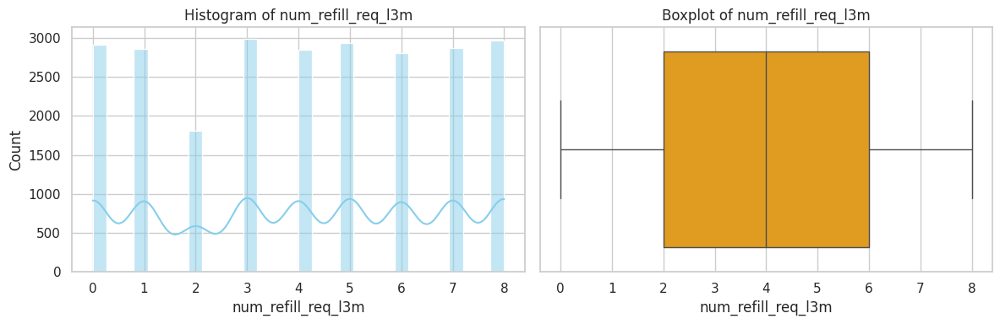

In [ ]:
# EDA for num_refill_req_l3m
col = 'num_refill_req_l3m'

# Basic Stats
minimum = df[col].min()
maximum = df[col].max()
mean_val = df[col].mean()
median_val = df[col].median()
std_dev = df[col].std()
q1 = df[col].quantile(0.25)
q3 = df[col].quantile(0.75)
iqr = q3 - q1

# Outlier thresholds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Outliers
lower_outliers = df[df[col] < lower_bound]
upper_outliers = df[df[col] > upper_bound]

# Print results
print(f" EDA for {col}")
print(f"Minimum: {minimum}")
print(f"Maximum: {maximum}")
print(f"Mean: {mean_val}")
print(f"Median: {median_val}")
print(f"Standard Deviation: {std_dev}")
print(f"IQR: {iqr}")
print(f"Lower Outlier Threshold: {lower_bound}")
print(f"Upper Outlier Threshold: {upper_bound}")
print(f"# Lower Outliers: {lower_outliers.shape[0]}")
print(f"# Upper Outliers: {upper_outliers.shape[0]}")

# Visualizations
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.histplot(df[col], kde=True, color='skyblue')
plt.title(f'Histogram of {col}')

plt.subplot(1, 2, 2)
sns.boxplot(x=df[col], color='orange')
plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()


### Univariate Analysis: `transport_issue_l1y`

 EDA for transport_issue_l1y
Minimum: 0
Maximum: 5
Mean: 0.77368
Median: 0.0
Standard Deviation: 1.1994485419026377
IQR: 1.0
Lower Outlier Threshold: -1.5
Upper Outlier Threshold: 2.5
# Lower Outliers: 0
# Upper Outliers: 2943


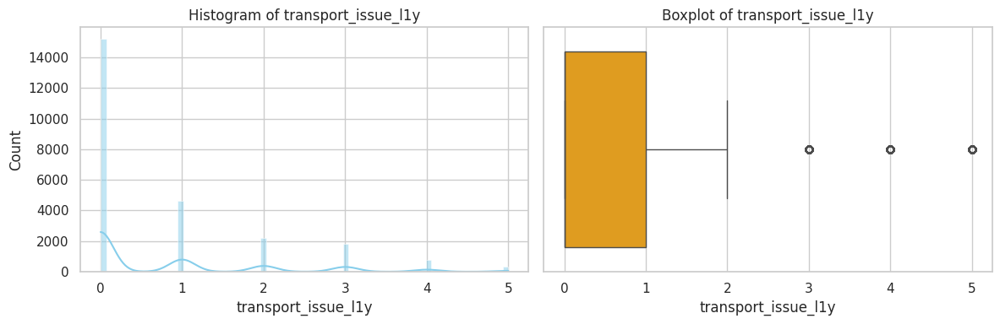

In [ ]:
# EDA for transport_issue_l1y
col = 'transport_issue_l1y'

# Basic Stats
minimum = df[col].min()
maximum = df[col].max()
mean_val = df[col].mean()
median_val = df[col].median()
std_dev = df[col].std()
q1 = df[col].quantile(0.25)
q3 = df[col].quantile(0.75)
iqr = q3 - q1

# Outlier thresholds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Outliers
lower_outliers = df[df[col] < lower_bound]
upper_outliers = df[df[col] > upper_bound]

# Print results
print(f" EDA for {col}")
print(f"Minimum: {minimum}")
print(f"Maximum: {maximum}")
print(f"Mean: {mean_val}")
print(f"Median: {median_val}")
print(f"Standard Deviation: {std_dev}")
print(f"IQR: {iqr}")
print(f"Lower Outlier Threshold: {lower_bound}")
print(f"Upper Outlier Threshold: {upper_bound}")
print(f"# Lower Outliers: {lower_outliers.shape[0]}")
print(f"# Upper Outliers: {upper_outliers.shape[0]}")

# Visualizations
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.histplot(df[col], kde=True, color='skyblue')
plt.title(f'Histogram of {col}')

plt.subplot(1, 2, 2)
sns.boxplot(x=df[col], color='orange')
plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

### Univariate Analysis: `Competitor_in_mkt`

 EDA for Competitor_in_mkt
Minimum: 0
Maximum: 12
Mean: 3.1042
Median: 3.0
Standard Deviation: 1.1416630395085952
IQR: 2.0
Lower Outlier Threshold: -1.0
Upper Outlier Threshold: 7.0
# Lower Outliers: 0
# Upper Outliers: 96


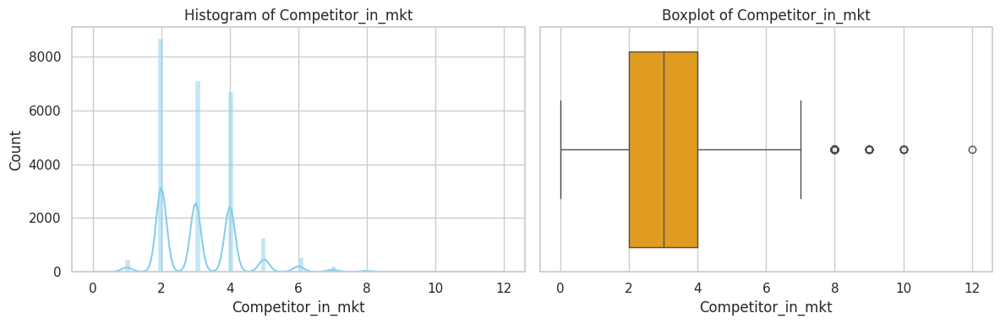

In [ ]:
# EDA for Competitor_in_mkt
col = 'Competitor_in_mkt'

# Basic Stats
minimum = df[col].min()
maximum = df[col].max()
mean_val = df[col].mean()
median_val = df[col].median()
std_dev = df[col].std()
q1 = df[col].quantile(0.25)
q3 = df[col].quantile(0.75)
iqr = q3 - q1

# Outlier thresholds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Outliers
lower_outliers = df[df[col] < lower_bound]
upper_outliers = df[df[col] > upper_bound]

# Print results
print(f" EDA for {col}")
print(f"Minimum: {minimum}")
print(f"Maximum: {maximum}")
print(f"Mean: {mean_val}")
print(f"Median: {median_val}")
print(f"Standard Deviation: {std_dev}")
print(f"IQR: {iqr}")
print(f"Lower Outlier Threshold: {lower_bound}")
print(f"Upper Outlier Threshold: {upper_bound}")
print(f"# Lower Outliers: {lower_outliers.shape[0]}")
print(f"# Upper Outliers: {upper_outliers.shape[0]}")

# Visualizations
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.histplot(df[col], kde=True, color='skyblue')
plt.title(f'Histogram of {col}')

plt.subplot(1, 2, 2)
sns.boxplot(x=df[col], color='orange')
plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

### Univariate Analysis: `retail_shop_num`


 EDA for retail_shop_num
Minimum: 1821
Maximum: 11008
Mean: 4985.71156
Median: 4859.0
Standard Deviation: 1052.8252519781329
IQR: 1187.0
Lower Outlier Threshold: 2532.5
Upper Outlier Threshold: 7280.5
# Lower Outliers: 81
# Upper Outliers: 867


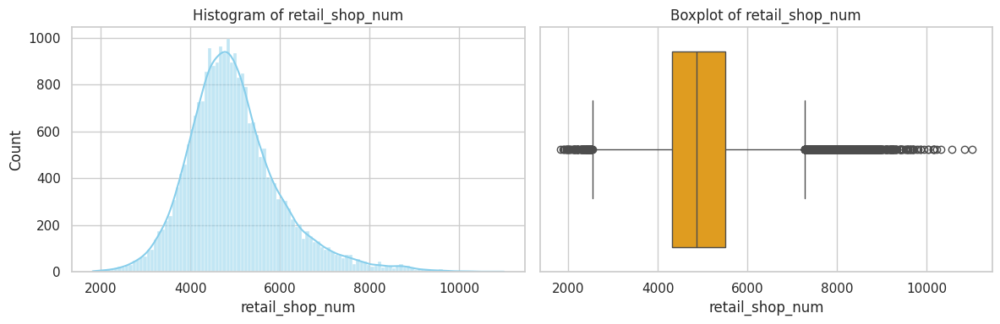

In [ ]:
# EDA for retail_shop_num
col = 'retail_shop_num'

# Basic Stats
minimum = df[col].min()
maximum = df[col].max()
mean_val = df[col].mean()
median_val = df[col].median()
std_dev = df[col].std()
q1 = df[col].quantile(0.25)
q3 = df[col].quantile(0.75)
iqr = q3 - q1

# Outlier thresholds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Outliers
lower_outliers = df[df[col] < lower_bound]
upper_outliers = df[df[col] > upper_bound]

# Print results
print(f" EDA for {col}")
print(f"Minimum: {minimum}")
print(f"Maximum: {maximum}")
print(f"Mean: {mean_val}")
print(f"Median: {median_val}")
print(f"Standard Deviation: {std_dev}")
print(f"IQR: {iqr}")
print(f"Lower Outlier Threshold: {lower_bound}")
print(f"Upper Outlier Threshold: {upper_bound}")
print(f"# Lower Outliers: {lower_outliers.shape[0]}")
print(f"# Upper Outliers: {upper_outliers.shape[0]}")

# Visualizations
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.histplot(df[col], kde=True, color='skyblue')
plt.title(f'Histogram of {col}')

plt.subplot(1, 2, 2)
sns.boxplot(x=df[col], color='orange')
plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

### Univariate Analysis: `distributor_num`

 EDA for distributor_num
Minimum: 15
Maximum: 70
Mean: 42.41812
Median: 42.0
Standard Deviation: 16.06432874949726
IQR: 27.0
Lower Outlier Threshold: -11.5
Upper Outlier Threshold: 96.5
# Lower Outliers: 0
# Upper Outliers: 0


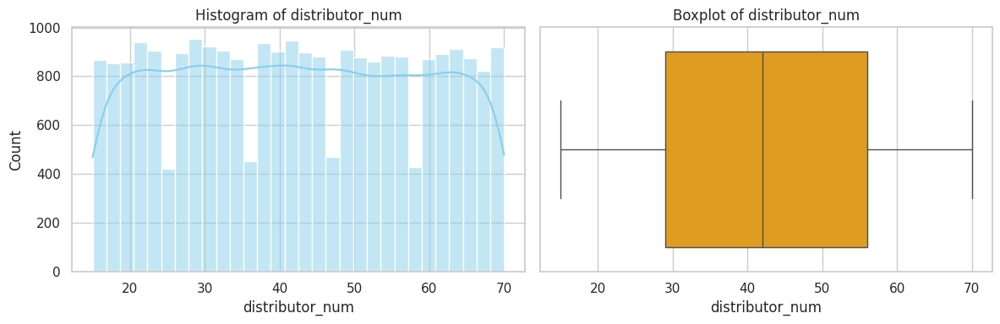

In [ ]:
# EDA for distributor_num
col = 'distributor_num'

# Basic Stats
minimum = df[col].min()
maximum = df[col].max()
mean_val = df[col].mean()
median_val = df[col].median()
std_dev = df[col].std()
q1 = df[col].quantile(0.25)
q3 = df[col].quantile(0.75)
iqr = q3 - q1

# Outlier thresholds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Outliers
lower_outliers = df[df[col] < lower_bound]
upper_outliers = df[df[col] > upper_bound]

# Print results
print(f" EDA for {col}")
print(f"Minimum: {minimum}")
print(f"Maximum: {maximum}")
print(f"Mean: {mean_val}")
print(f"Median: {median_val}")
print(f"Standard Deviation: {std_dev}")
print(f"IQR: {iqr}")
print(f"Lower Outlier Threshold: {lower_bound}")
print(f"Upper Outlier Threshold: {upper_bound}")
print(f"# Lower Outliers: {lower_outliers.shape[0]}")
print(f"# Upper Outliers: {upper_outliers.shape[0]}")

# Visualizations
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.histplot(df[col], kde=True, color='skyblue')
plt.title(f'Histogram of {col}')

plt.subplot(1, 2, 2)
sns.boxplot(x=df[col], color='orange')
plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

### Univariate Analysis: `dist_from_hub`

 EDA for dist_from_hub
Minimum: 55
Maximum: 271
Mean: 163.53732
Median: 164.0
Standard Deviation: 62.71860929720701
IQR: 109.0
Lower Outlier Threshold: -54.5
Upper Outlier Threshold: 381.5
# Lower Outliers: 0
# Upper Outliers: 0


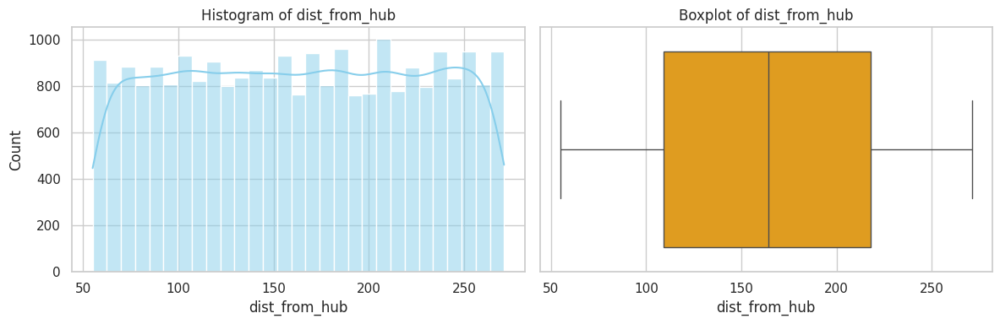

In [ ]:
# EDA for dist_from_hub
col = 'dist_from_hub'

# Basic Stats
minimum = df[col].min()
maximum = df[col].max()
mean_val = df[col].mean()
median_val = df[col].median()
std_dev = df[col].std()
q1 = df[col].quantile(0.25)
q3 = df[col].quantile(0.75)
iqr = q3 - q1

# Outlier thresholds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Outliers
lower_outliers = df[df[col] < lower_bound]
upper_outliers = df[df[col] > upper_bound]

# Print results
print(f" EDA for {col}")
print(f"Minimum: {minimum}")
print(f"Maximum: {maximum}")
print(f"Mean: {mean_val}")
print(f"Median: {median_val}")
print(f"Standard Deviation: {std_dev}")
print(f"IQR: {iqr}")
print(f"Lower Outlier Threshold: {lower_bound}")
print(f"Upper Outlier Threshold: {upper_bound}")
print(f"# Lower Outliers: {lower_outliers.shape[0]}")
print(f"# Upper Outliers: {upper_outliers.shape[0]}")

# Visualizations
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.histplot(df[col], kde=True, color='skyblue')
plt.title(f'Histogram of {col}')

plt.subplot(1, 2, 2)
sns.boxplot(x=df[col], color='orange')
plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

### Univariate Analysis: `workers_num`

 EDA for workers_num
Minimum: 10.0
Maximum: 98.0
Mean: 28.944398167430236
Median: 28.0
Standard Deviation: 7.87253395365751
IQR: 9.0
Lower Outlier Threshold: 10.5
Upper Outlier Threshold: 46.5
# Lower Outliers: 5
# Upper Outliers: 602


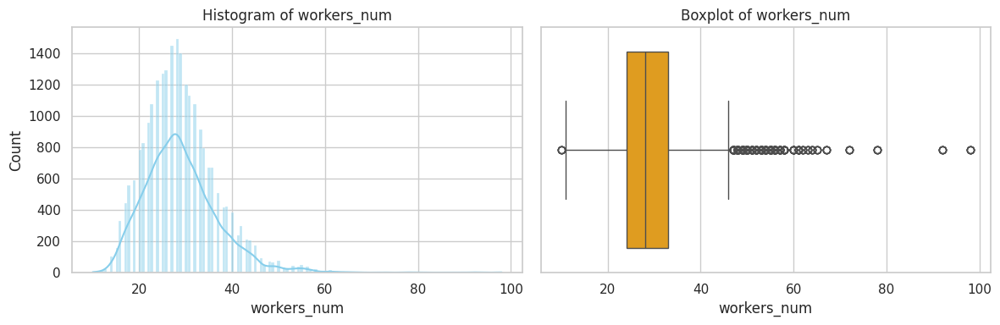

In [ ]:
# EDA for workers_num
col = 'workers_num'

# Basic Stats
minimum = df[col].min()
maximum = df[col].max()
mean_val = df[col].mean()
median_val = df[col].median()
std_dev = df[col].std()
q1 = df[col].quantile(0.25)
q3 = df[col].quantile(0.75)
iqr = q3 - q1

# Outlier thresholds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Outliers
lower_outliers = df[df[col] < lower_bound]
upper_outliers = df[df[col] > upper_bound]

# Print results
print(f" EDA for {col}")
print(f"Minimum: {minimum}")
print(f"Maximum: {maximum}")
print(f"Mean: {mean_val}")
print(f"Median: {median_val}")
print(f"Standard Deviation: {std_dev}")
print(f"IQR: {iqr}")
print(f"Lower Outlier Threshold: {lower_bound}")
print(f"Upper Outlier Threshold: {upper_bound}")
print(f"# Lower Outliers: {lower_outliers.shape[0]}")
print(f"# Upper Outliers: {upper_outliers.shape[0]}")

# Visualizations
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.histplot(df[col], kde=True, color='skyblue')
plt.title(f'Histogram of {col}')

plt.subplot(1, 2, 2)
sns.boxplot(x=df[col], color='orange')
plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

### Univariate Analysis: `storage_issue_reported_l3m`

 EDA for storage_issue_reported_l3m
Minimum: 0
Maximum: 39
Mean: 17.13044
Median: 18.0
Standard Deviation: 9.161108144896923
IQR: 14.0
Lower Outlier Threshold: -11.0
Upper Outlier Threshold: 45.0
# Lower Outliers: 0
# Upper Outliers: 0


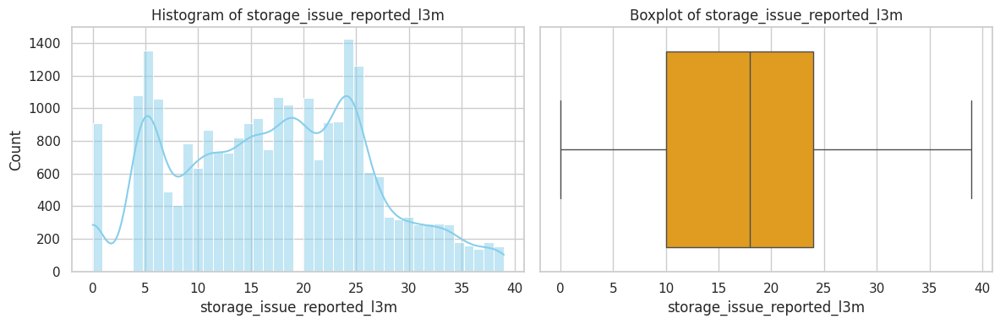

In [ ]:
# EDA for storage_issue_reported_l3m
col = 'storage_issue_reported_l3m'

# Basic Stats
minimum = df[col].min()
maximum = df[col].max()
mean_val = df[col].mean()
median_val = df[col].median()
std_dev = df[col].std()
q1 = df[col].quantile(0.25)
q3 = df[col].quantile(0.75)
iqr = q3 - q1

# Outlier thresholds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Outliers
lower_outliers = df[df[col] < lower_bound]
upper_outliers = df[df[col] > upper_bound]

# Print results
print(f" EDA for {col}")
print(f"Minimum: {minimum}")
print(f"Maximum: {maximum}")
print(f"Mean: {mean_val}")
print(f"Median: {median_val}")
print(f"Standard Deviation: {std_dev}")
print(f"IQR: {iqr}")
print(f"Lower Outlier Threshold: {lower_bound}")
print(f"Upper Outlier Threshold: {upper_bound}")
print(f"# Lower Outliers: {lower_outliers.shape[0]}")
print(f"# Upper Outliers: {upper_outliers.shape[0]}")

# Visualizations
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.histplot(df[col], kde=True, color='skyblue')
plt.title(f'Histogram of {col}')

plt.subplot(1, 2, 2)
sns.boxplot(x=df[col], color='orange')
plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

### Univariate Analysis: `wh_breakdown_l3m`

 EDA for wh_breakdown_l3m
Minimum: 0
Maximum: 6
Mean: 3.48204
Median: 3.0
Standard Deviation: 1.6903347975088805
IQR: 3.0
Lower Outlier Threshold: -2.5
Upper Outlier Threshold: 9.5
# Lower Outliers: 0
# Upper Outliers: 0


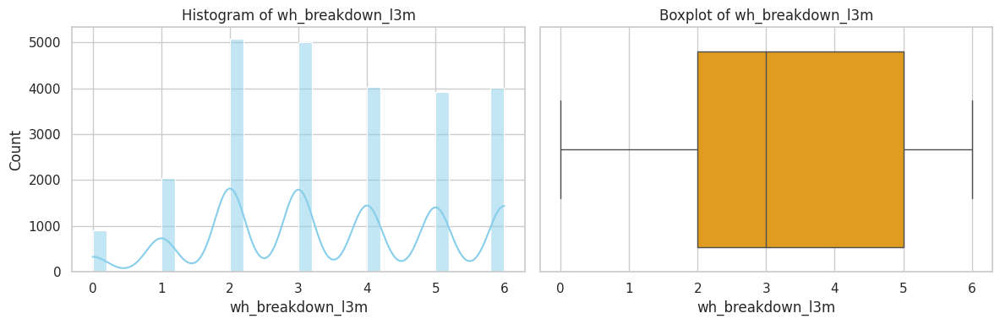

In [ ]:
# EDA for wh_breakdown_l3m
col = 'wh_breakdown_l3m'

# Basic Stats
minimum = df[col].min()
maximum = df[col].max()
mean_val = df[col].mean()
median_val = df[col].median()
std_dev = df[col].std()
q1 = df[col].quantile(0.25)
q3 = df[col].quantile(0.75)
iqr = q3 - q1

# Outlier thresholds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Outliers
lower_outliers = df[df[col] < lower_bound]
upper_outliers = df[df[col] > upper_bound]

# Print results
print(f" EDA for {col}")
print(f"Minimum: {minimum}")
print(f"Maximum: {maximum}")
print(f"Mean: {mean_val}")
print(f"Median: {median_val}")
print(f"Standard Deviation: {std_dev}")
print(f"IQR: {iqr}")
print(f"Lower Outlier Threshold: {lower_bound}")
print(f"Upper Outlier Threshold: {upper_bound}")
print(f"# Lower Outliers: {lower_outliers.shape[0]}")
print(f"# Upper Outliers: {upper_outliers.shape[0]}")

# Visualizations
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.histplot(df[col], kde=True, color='skyblue')
plt.title(f'Histogram of {col}')

plt.subplot(1, 2, 2)
sns.boxplot(x=df[col], color='orange')
plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

### Univariate Analysis: `govt_check_l3m`

 EDA for govt_check_l3m
Minimum: 1
Maximum: 32
Mean: 18.81228
Median: 21.0
Standard Deviation: 8.63238216962629
IQR: 15.0
Lower Outlier Threshold: -11.5
Upper Outlier Threshold: 48.5
# Lower Outliers: 0
# Upper Outliers: 0


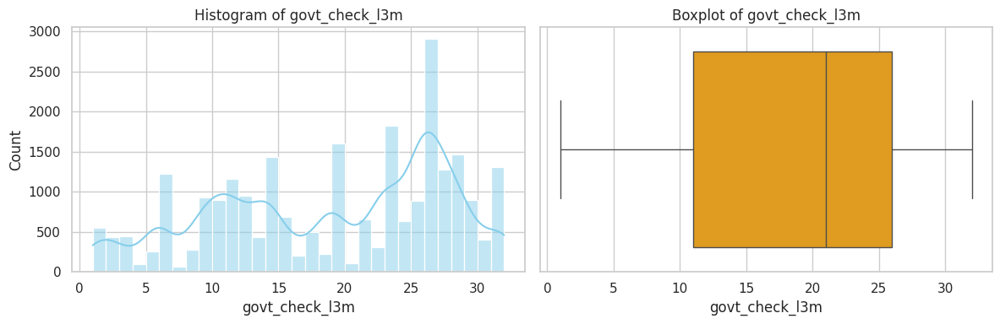

In [ ]:
# EDA for govt_check_l3m
col = 'govt_check_l3m'

# Basic Stats
minimum = df[col].min()
maximum = df[col].max()
mean_val = df[col].mean()
median_val = df[col].median()
std_dev = df[col].std()
q1 = df[col].quantile(0.25)
q3 = df[col].quantile(0.75)
iqr = q3 - q1

# Outlier thresholds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Outliers
lower_outliers = df[df[col] < lower_bound]
upper_outliers = df[df[col] > upper_bound]

# Print results
print(f" EDA for {col}")
print(f"Minimum: {minimum}")
print(f"Maximum: {maximum}")
print(f"Mean: {mean_val}")
print(f"Median: {median_val}")
print(f"Standard Deviation: {std_dev}")
print(f"IQR: {iqr}")
print(f"Lower Outlier Threshold: {lower_bound}")
print(f"Upper Outlier Threshold: {upper_bound}")
print(f"# Lower Outliers: {lower_outliers.shape[0]}")
print(f"# Upper Outliers: {upper_outliers.shape[0]}")

# Visualizations
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.histplot(df[col], kde=True, color='skyblue')
plt.title(f'Histogram of {col}')

plt.subplot(1, 2, 2)
sns.boxplot(x=df[col], color='orange')
plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

### Univariate Analysis: `product_wg_ton`

 EDA for product_wg_ton
Minimum: 2065
Maximum: 55151
Mean: 22102.63292
Median: 22101.0
Standard Deviation: 11607.755076596359
IQR: 17044.0
Lower Outlier Threshold: -12507.0
Upper Outlier Threshold: 55669.0
# Lower Outliers: 0
# Upper Outliers: 0


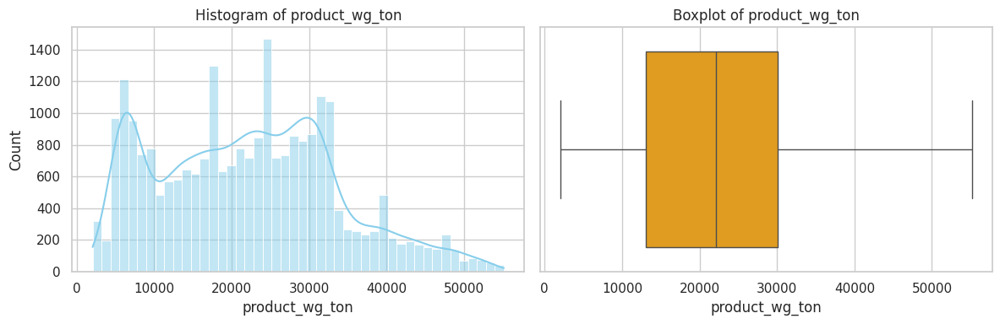

In [ ]:
# EDA for product_wg_ton
col = 'product_wg_ton'

# Basic Stats
minimum = df[col].min()
maximum = df[col].max()
mean_val = df[col].mean()
median_val = df[col].median()
std_dev = df[col].std()
q1 = df[col].quantile(0.25)
q3 = df[col].quantile(0.75)
iqr = q3 - q1

# Outlier thresholds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Outliers
lower_outliers = df[df[col] < lower_bound]
upper_outliers = df[df[col] > upper_bound]

# Print results
print(f" EDA for {col}")
print(f"Minimum: {minimum}")
print(f"Maximum: {maximum}")
print(f"Mean: {mean_val}")
print(f"Median: {median_val}")
print(f"Standard Deviation: {std_dev}")
print(f"IQR: {iqr}")
print(f"Lower Outlier Threshold: {lower_bound}")
print(f"Upper Outlier Threshold: {upper_bound}")
print(f"# Lower Outliers: {lower_outliers.shape[0]}")
print(f"# Upper Outliers: {upper_outliers.shape[0]}")

# Visualizations
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
sns.histplot(df[col], kde=True, color='skyblue')
plt.title(f'Histogram of {col}')

plt.subplot(1, 2, 2)
sns.boxplot(x=df[col], color='orange')
plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

### Bivariate Analysis: Introduction

In this step, we load and clean the FMCG dataset, standardize column names for consistency, and classify variables into quantitative and qualitative groups. This setup will allow us to conduct meaningful bivariate analyses by exploring:
- Quantitative vs Quantitative (using scatterplots and correlation)
- Quantitative vs Qualitative (using boxplots, group statistics)
- Qualitative vs Qualitative (using crosstabs or heatmaps)

This stage is essential for understanding how two variables interact with one another, which is critical for predictive modeling, feature selection, and domain insight.


In [ ]:
# Load the CSV file (make sure it's in the same directory as your notebook)
df = pd.read_csv("FMCG_data.csv")

# Clean column names: lowercase and strip spaces
df.columns = df.columns.str.strip().str.lower()

# Define the finalized variable lists
quantitative_vars = [
    "num_refill_req_l3m", "transport_issue_l1y", "competitor_in_mkt", "retail_shop_num",
    "distributor_num", "dist_from_hub", "workers_num", "storage_issue_reported_l3m",
    "wh_breakdown_l3m", "govt_check_l3m", "product_wg_ton"
]

qualitative_vars = [
    "ware_house_id", "wh_manager_id", "location_type", "wh_capacity_size", "zone",
    "wh_regional_zone", "wh_owner_type", "flood_impacted", "flood_proof", "electric_supply",
    "wh_est_year", "temp_reg_mach", "approved_wh_govt_certificate", "inventory_status"
]

# Check availability in dataset
available_quantitative = [var for var in quantitative_vars if var in df.columns]
available_qualitative = [var for var in qualitative_vars if var in df.columns]

print(" Quantitative Variables Found:", available_quantitative)
print(" Qualitative Variables Found:", available_qualitative)

 Quantitative Variables Found: ['num_refill_req_l3m', 'transport_issue_l1y', 'competitor_in_mkt', 'retail_shop_num', 'distributor_num', 'dist_from_hub', 'workers_num', 'storage_issue_reported_l3m', 'wh_breakdown_l3m', 'govt_check_l3m', 'product_wg_ton']
 Qualitative Variables Found: ['ware_house_id', 'wh_manager_id', 'location_type', 'wh_capacity_size', 'zone', 'wh_regional_zone', 'wh_owner_type', 'flood_impacted', 'flood_proof', 'electric_supply', 'wh_est_year', 'temp_reg_mach', 'approved_wh_govt_certificate', 'inventory_status']


# Histograms of Quantitative Variables

The following plots illustrate the distribution of all quantitative variables in the dataset. Histograms are useful for identifying data patterns, skewness, modality, and potential outliers. This visual overview helps in assessing the nature of the data and informs preprocessing decisions for further analysis or modeling tasks.


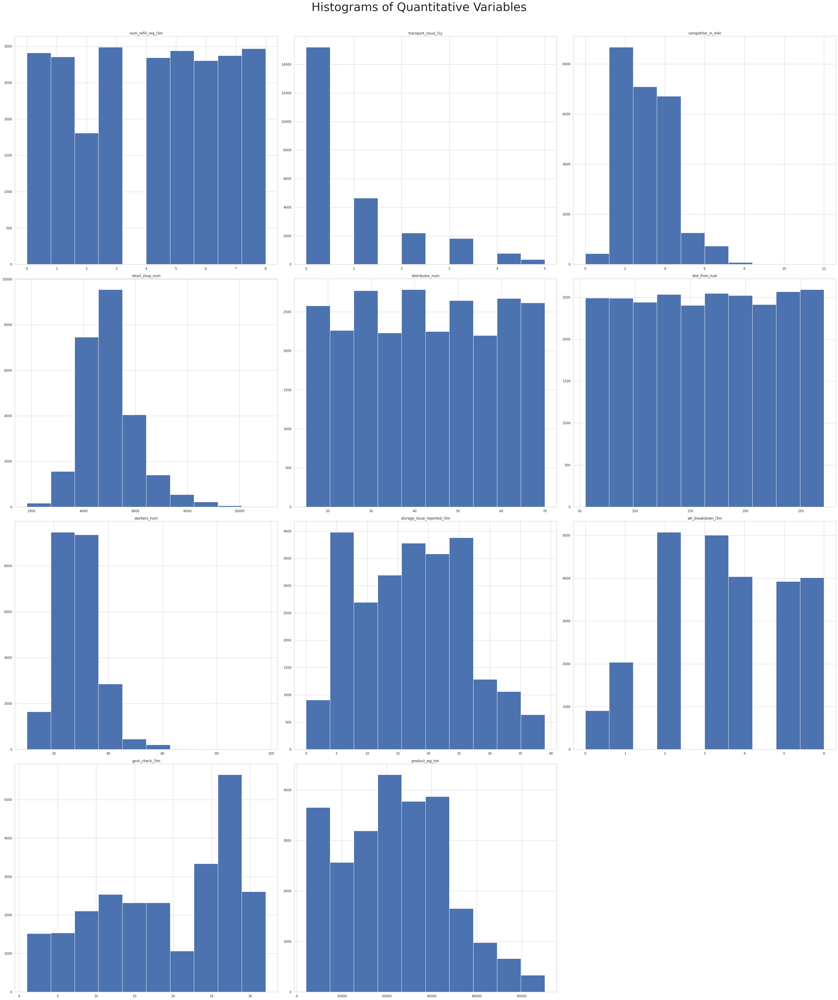

In [ ]:
df[quantitative_vars].hist(figsize=(40, 50))
plt.suptitle("Histograms of Quantitative Variables", fontsize=40)
plt.tight_layout(rect=[0, 0.03, 1, 0.97])  # leave space at top for title
plt.show()

# Bar Charts of Qualitative Variables

This section provides bar chart visualizations for all qualitative (categorical) variables in the dataset. These plots display the frequency distribution of each category, helping identify dominant categories, class imbalance, and data quality issues such as missing or uncommon values. This aids in understanding the overall structure of categorical data before feature engineering or model encoding.


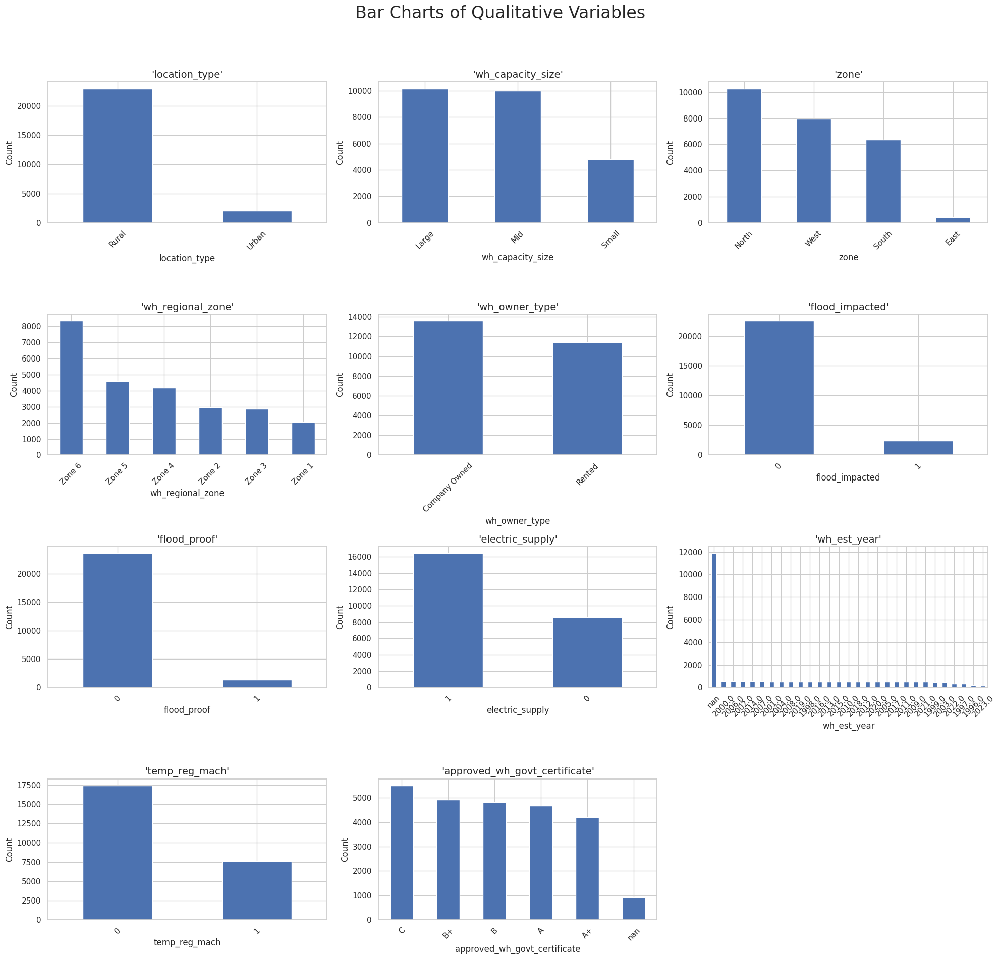

In [ ]:
import matplotlib.pyplot as plt
import math

# Your finalized list of 13 qualitative variables
qualitative_vars = [
    'location_type', 'wh_capacity_size', 'zone',
    'wh_regional_zone', 'wh_owner_type', 'flood_impacted', 'flood_proof', 'electric_supply',
    'wh_est_year', 'temp_reg_mach', 'approved_wh_govt_certificate'
]

# Filter columns that actually exist in the dataset and convert to string for plotting
plot_vars = [col for col in qualitative_vars if col in df.columns]
df[plot_vars] = df[plot_vars].astype(str)

# Set number of columns in grid
n_cols = 3
n_rows = math.ceil(len(plot_vars) / n_cols)

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))
fig.suptitle("Bar Charts of Qualitative Variables", fontsize=24)

# Flatten axes for easy looping
axes = axes.flatten()

# Plot each variable
for i, col in enumerate(plot_vars):
    val_counts = df[col].value_counts().sort_values(ascending=False)

    # Optionally skip IDs with too many unique values (>50 categories looks messy)
    if val_counts.shape[0] > 50:
        axes[i].text(0.5, 0.5, f"'{col}' has too many categories to display",
                     ha='center', va='center', fontsize=12)
        axes[i].axis('off')
        continue

    val_counts.plot(kind='bar', ax=axes[i])
    axes[i].set_title(f"'{col}'", fontsize=14)
    axes[i].set_xlabel(col)
    axes[i].set_ylabel("Count")
    axes[i].tick_params(axis='x', rotation=45)

# Hide unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # leave space for the title
plt.show()

### Bivariate Analysis: Numeric and Categorical Variable Interactions

This function performs bivariate analysis for three categories of variable combinations:

1. **Quantitative vs Regression Target (`product_wg_ton`)**  
   - Uses scatterplots to visualize linear relationships.
   - Computes Pearson correlation coefficients to assess strength and direction.
   - Interpretation is printed based on correlation value.

2. **Quantitative vs Classification Target (`inventory_status`)**  
   - Uses boxplots to compare distributions of numeric features across inventory categories.
   - Also prints mean values for each class to quantify group differences.

3. **Qualitative vs Classification Target (`inventory_status`)**  
   - Uses countplots (with `hue`) to visualize class frequency distribution across categories.
   - Restricts to features with ≤10 unique values for clarity and interpretability.

This bivariate analysis helps assess potential predictors and how strongly they relate to the regression and classification targets, aiding feature selection and modeling strategy.


=== Bivariate Analysis: Numeric Variables vs. Regression Target ===



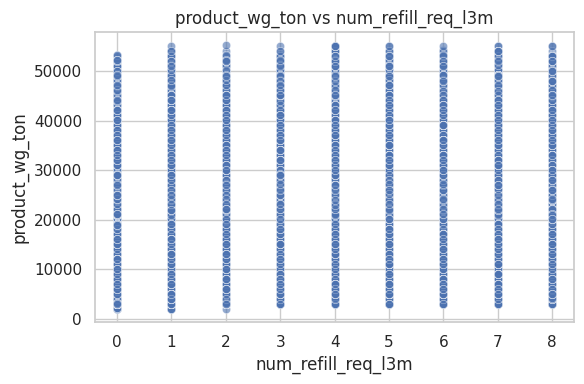

Correlation between num_refill_req_l3m and product_wg_ton: 0.00
- Weak or no linear relationship.



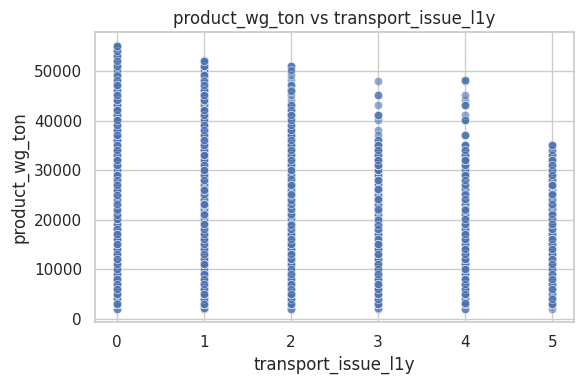

Correlation between transport_issue_l1y and product_wg_ton: -0.17
- Weak or no linear relationship.



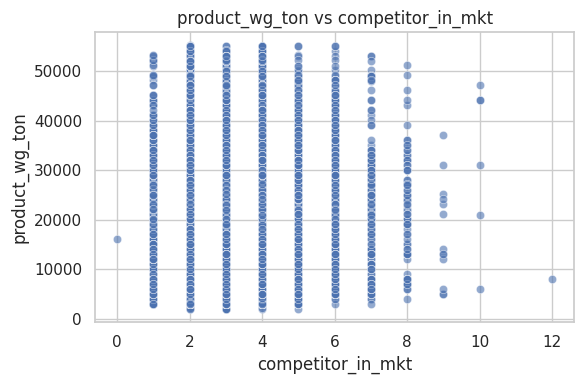

Correlation between competitor_in_mkt and product_wg_ton: 0.01
- Weak or no linear relationship.



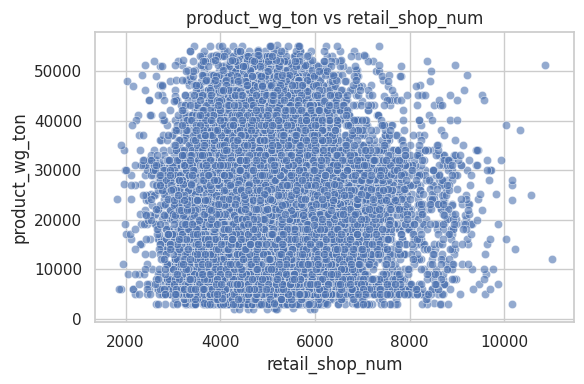

Correlation between retail_shop_num and product_wg_ton: -0.01
- Weak or no linear relationship.



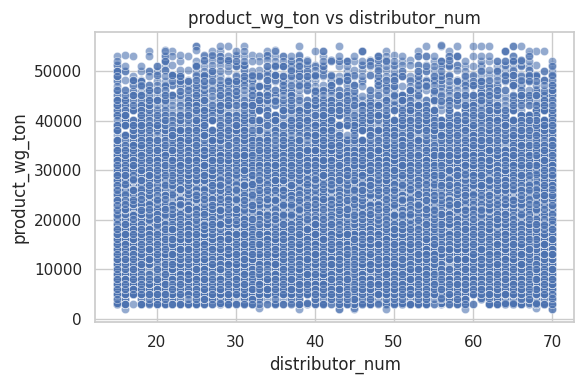

Correlation between distributor_num and product_wg_ton: 0.00
- Weak or no linear relationship.



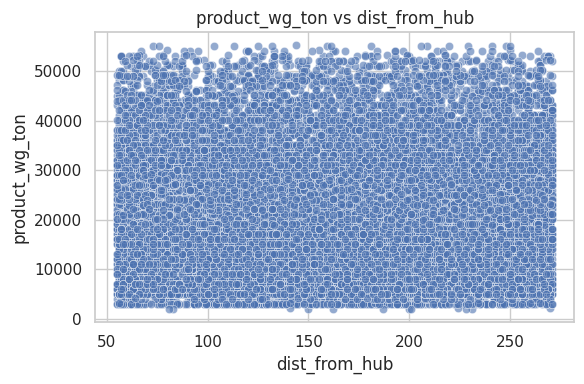

Correlation between dist_from_hub and product_wg_ton: -0.01
- Weak or no linear relationship.



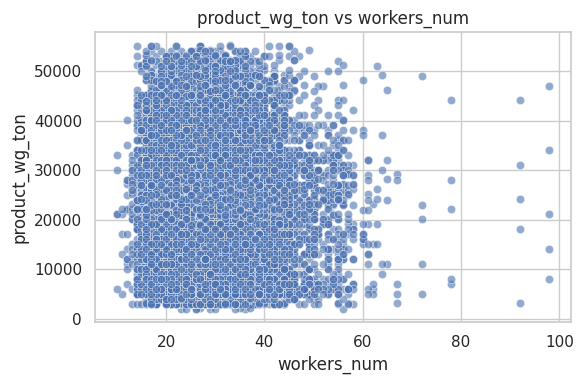

Correlation between workers_num and product_wg_ton: -0.01
- Weak or no linear relationship.



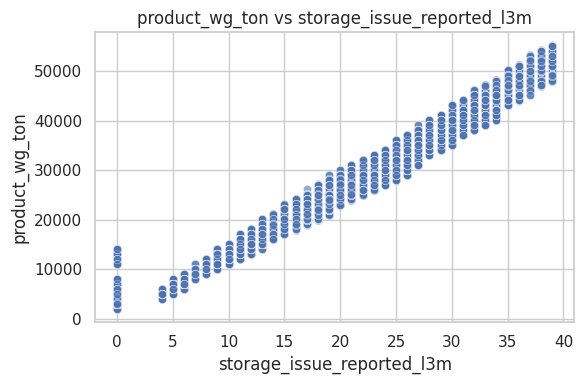

Correlation between storage_issue_reported_l3m and product_wg_ton: 0.99
- Strong relationship. Useful for regression.



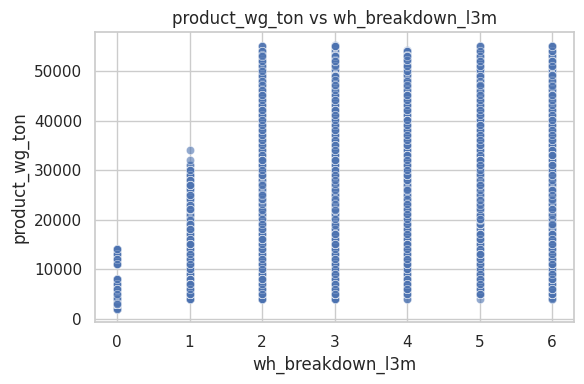

Correlation between wh_breakdown_l3m and product_wg_ton: 0.34
- Moderate relationship. Could be useful.



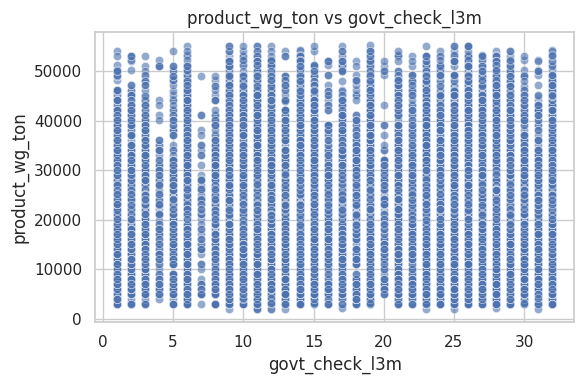

Correlation between govt_check_l3m and product_wg_ton: -0.01
- Weak or no linear relationship.


=== Bivariate Analysis: Numeric Variables vs. Classification Target ===



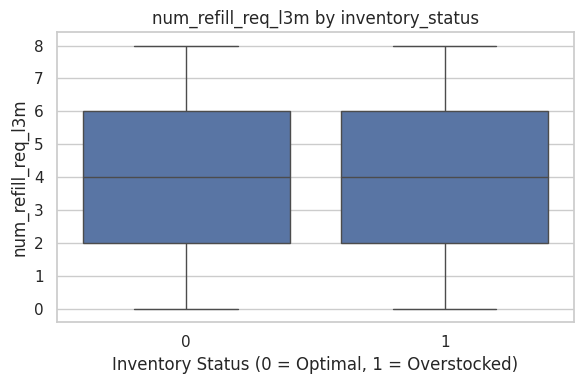

📌 Mean num_refill_req_l3m by Inventory Status:
inventory_status
0    4.094596
1    4.081214
Name: num_refill_req_l3m, dtype: float64



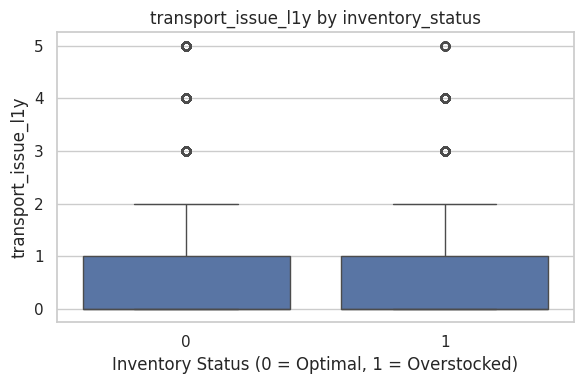

📌 Mean transport_issue_l1y by Inventory Status:
inventory_status
0    0.910192
1    0.581407
Name: transport_issue_l1y, dtype: float64



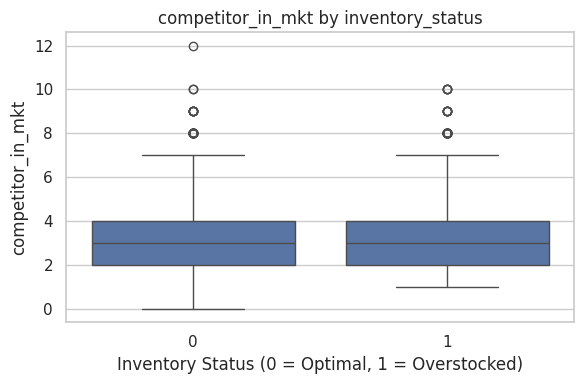

📌 Mean competitor_in_mkt by Inventory Status:
inventory_status
0    3.048769
1    3.182274
Name: competitor_in_mkt, dtype: float64



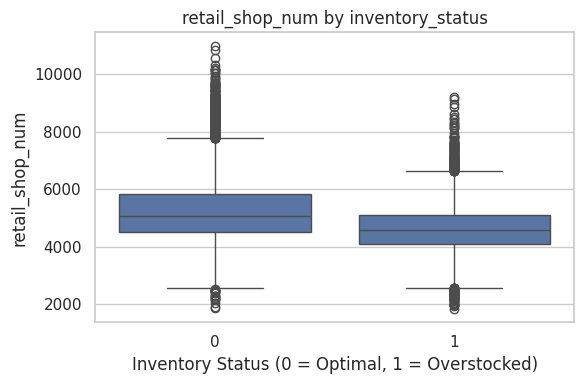

📌 Mean retail_shop_num by Inventory Status:
inventory_status
0    5249.752941
1    4613.815125
Name: retail_shop_num, dtype: float64



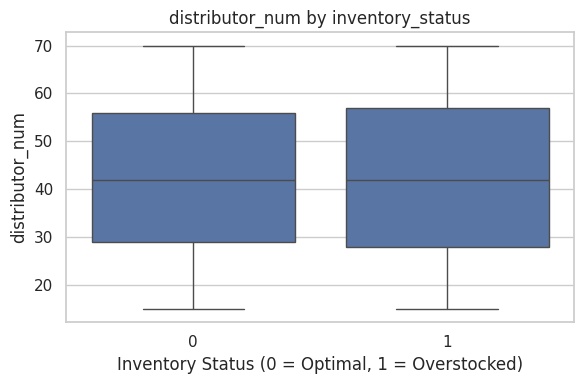

📌 Mean distributor_num by Inventory Status:
inventory_status
0    42.377086
1    42.475915
Name: distributor_num, dtype: float64



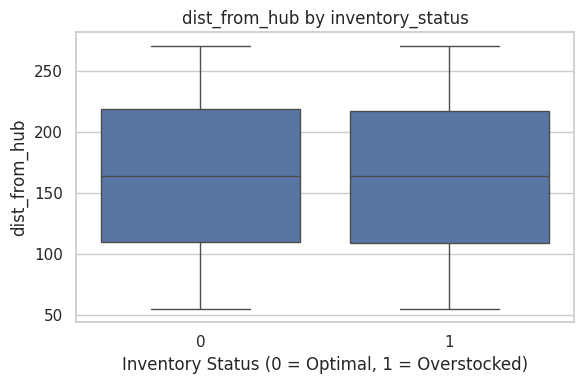

📌 Mean dist_from_hub by Inventory Status:
inventory_status
0    163.731874
1    163.263295
Name: dist_from_hub, dtype: float64



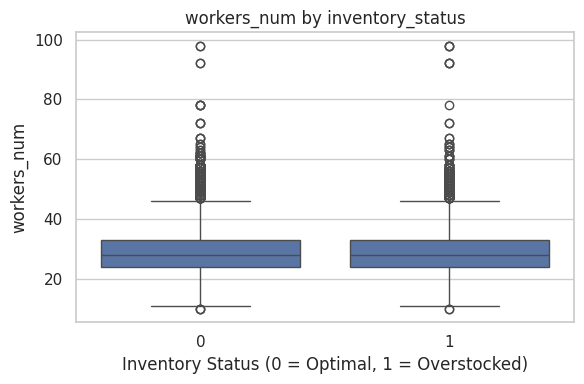

📌 Mean workers_num by Inventory Status:
inventory_status
0    28.974576
1    28.901886
Name: workers_num, dtype: float64



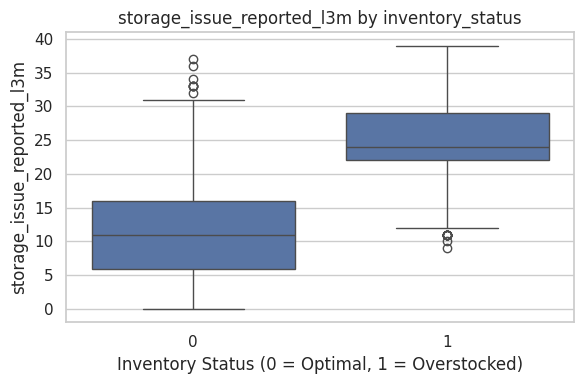

📌 Mean storage_issue_reported_l3m by Inventory Status:
inventory_status
0    11.347401
1    25.275723
Name: storage_issue_reported_l3m, dtype: float64



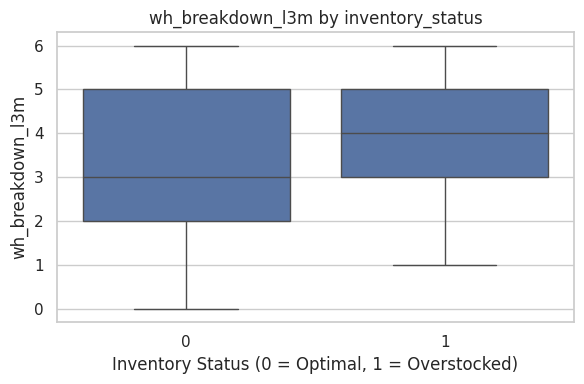

📌 Mean wh_breakdown_l3m by Inventory Status:
inventory_status
0    3.156088
1    3.941137
Name: wh_breakdown_l3m, dtype: float64



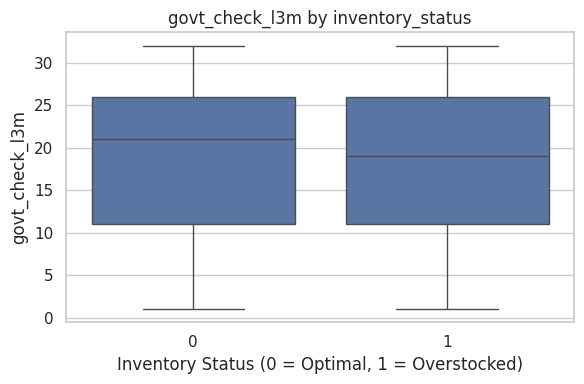

📌 Mean govt_check_l3m by Inventory Status:
inventory_status
0    18.959644
1    18.604721
Name: govt_check_l3m, dtype: float64



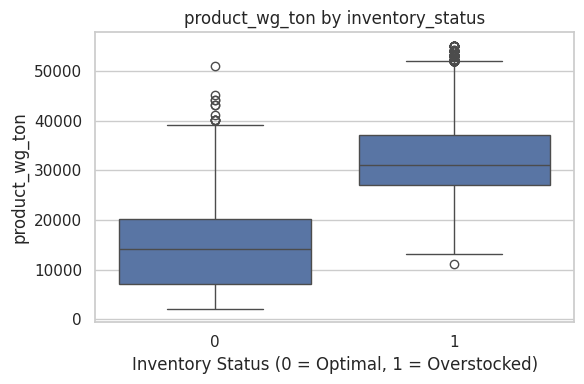

📌 Mean product_wg_ton by Inventory Status:
inventory_status
0    14703.237483
1    32524.517437
Name: product_wg_ton, dtype: float64


=== Bivariate Analysis: Categorical Variables vs. Inventory Status ===



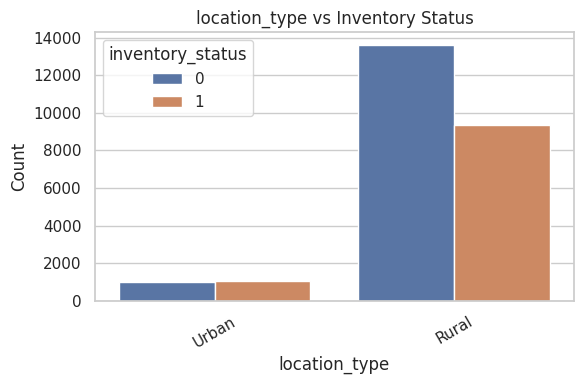

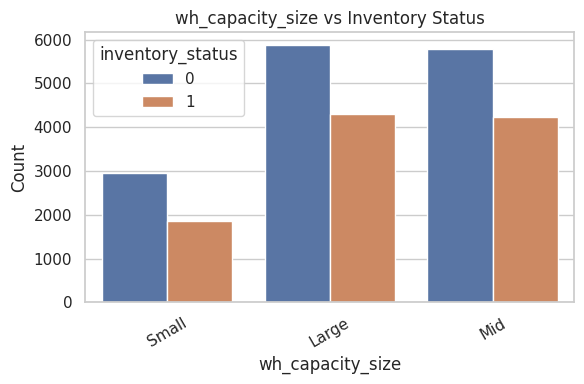

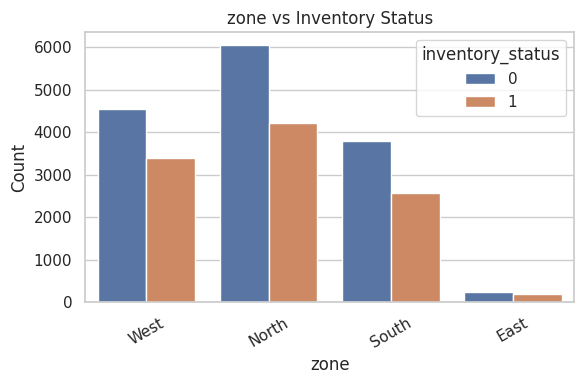

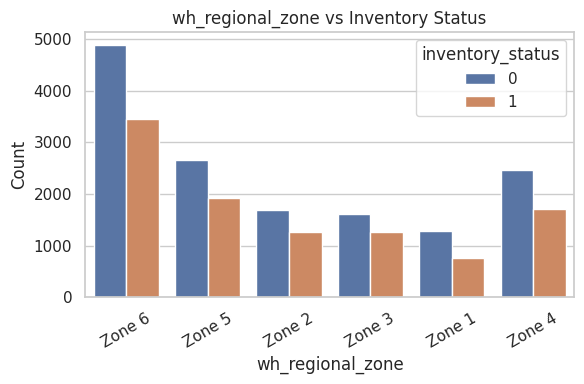

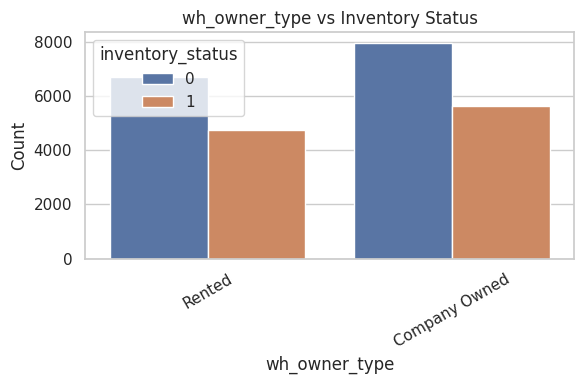

...

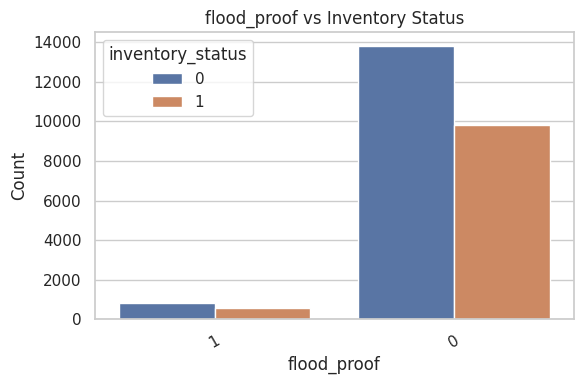

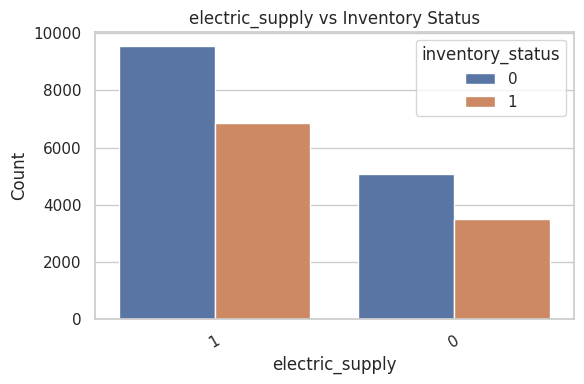

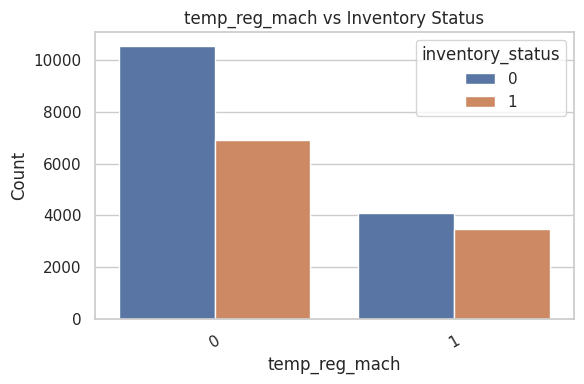

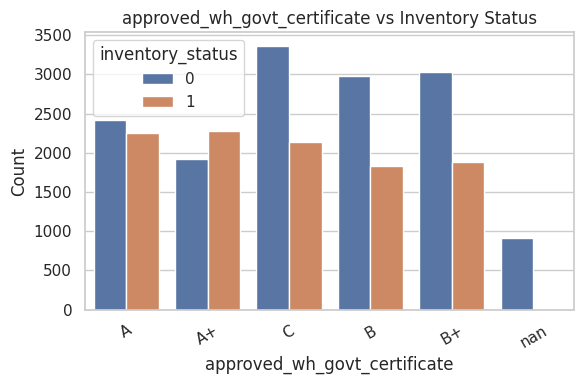

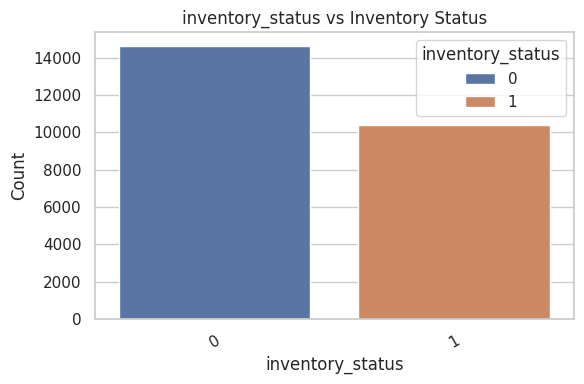

In [ ]:
def bivariate_analysis(df, target_regression='product_wg_ton', target_classification='inventory_status'):
    print("=== Bivariate Analysis: Numeric Variables vs. Regression Target ===\n")
    for col in available_quantitative:
        if col != target_regression:
            plt.figure(figsize=(6, 4))
            sns.scatterplot(data=df, x=col, y=target_regression, alpha=0.6)
            plt.title(f'{target_regression} vs {col}')
            plt.xlabel(col)
            plt.ylabel(target_regression)
            plt.tight_layout()
            plt.show()

            # Correlation coefficient
            corr = df[[col, target_regression]].corr().iloc[0, 1]
            print(f"Correlation between {col} and {target_regression}: {corr:.2f}")
            if abs(corr) > 0.5:
                print("- Strong relationship. Useful for regression.\n")
            elif abs(corr) > 0.3:
                print("- Moderate relationship. Could be useful.\n")
            else:
                print("- Weak or no linear relationship.\n")

    print("\n=== Bivariate Analysis: Numeric Variables vs. Classification Target ===\n")
    for col in available_quantitative:
        if col != target_classification:
            plt.figure(figsize=(6, 4))
            sns.boxplot(x=target_classification, y=col, data=df)
            plt.title(f'{col} by {target_classification}')
            plt.xlabel('Inventory Status (0 = Optimal, 1 = Overstocked)')
            plt.ylabel(col)
            plt.tight_layout()
            plt.show()

            # Mean comparison
            group_means = df.groupby(target_classification)[col].mean()
            print(f"📌 Mean {col} by Inventory Status:\n{group_means}\n")

    print("\n=== Bivariate Analysis: Categorical Variables vs. Inventory Status ===\n")
    for col in available_qualitative:
        if col in df.columns and df[col].nunique() <= 10:  # keep it interpretable
            plt.figure(figsize=(6, 4))
            sns.countplot(data=df, x=col, hue=target_classification)
            plt.title(f'{col} vs Inventory Status')
            plt.xlabel(col)
            plt.ylabel('Count')
            plt.xticks(rotation=30)
            plt.tight_layout()
            plt.show()
bivariate_analysis(df)

## Pearson Correlation Heatmap – Quantitative Variables

To understand the linear relationships between quantitative variables, we compute the **Pearson correlation coefficients** and visualize them using a heatmap.

- Values close to **+1** indicate a strong positive correlation.
- Values close to **-1** indicate a strong negative correlation.
- Values near **0** suggest little to no linear relationship.

The upper triangle of the correlation matrix is masked to reduce redundancy. This visualization helps identify multicollinearity and feature redundancy, which can guide feature selection and model tuning.


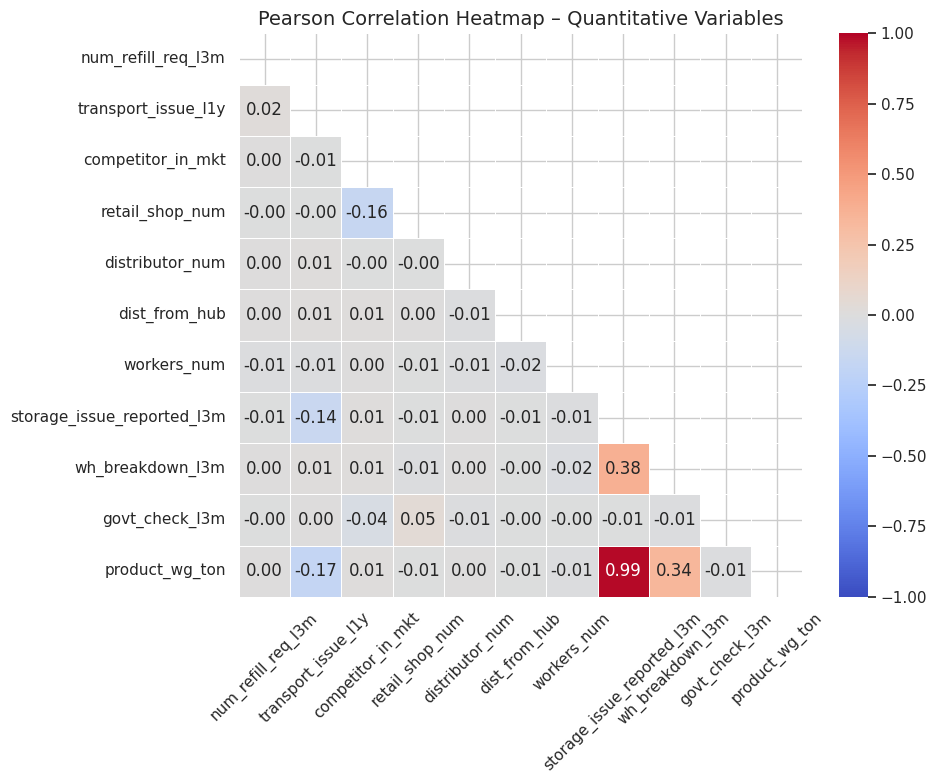

In [ ]:
def pearson_corr_heatmap(df, quantitative_vars):
    corr_matrix = df[quantitative_vars].corr(method='pearson')
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

    plt.figure(figsize=(10, 8))
    sns.heatmap(
        corr_matrix,
        mask=mask,
        annot=True,
        fmt=".2f",
        cmap='coolwarm',
        linewidths=0.5,
        square=True,
        vmin=-1, vmax=1
    )

    plt.title("Pearson Correlation Heatmap – Quantitative Variables", fontsize=14)
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

# Run it
pearson_corr_heatmap(df, available_quantitative)


### Data Cleaning & Preparation

Based on our exploratory analysis, this section focuses on preparing the data for modeling by addressing the following issues:

- Dropping irrelevant or high-cardinality variables.
- Handling missing values in both numeric and categorical variables.
- Ensuring consistency in data entries (e.g., replacing string-based "NA" values).
- Saving a cleaned version of the dataset for future steps.

#### Steps Performed

1. **Drop `wh_est_year`:** This column has too many unique values and doesn't contribute meaningfully to analysis or modeling.

2. **Impute missing values in `workers_num`:** As a numerical variable, it's imputed using the median, which is less sensitive to outliers.

3. **Handle missing values in `approved_wh_govt_certificate`:**
   - Fill missing entries with `'Unknown'`.
   - Replace any string "NA" with `'Unknown'` for consistency.

4. **Export cleaned dataset:** The cleaned DataFrame is saved to a new CSV file for use in downstream tasks.

5. **Final sanity check:** Display remaining missing values (if any) to confirm completeness.

In [ ]:
# 1. Safe drop of 'wh_est_year' if exists
if 'wh_est_year' in df.columns:
    df.drop(columns=['wh_est_year'], inplace=True)

# 2. Median imputation for 'workers_num'
if 'workers_num' in df.columns:
    median_workers = df['workers_num'].median()
    df['workers_num'].fillna(median_workers, inplace=True)

id_cols_to_drop = ['ware_house_id', 'wh_manager_id', 'approved_wh_govt_certificate']
# 3. Drop non-informative IDs
for col in id_cols_to_drop:
    if col in df.columns:
        df.drop(columns=[col], inplace=True)

# 4. Save cleaned DataFrame
output_path = 'FMCG_data_cleaned.csv'
df.to_csv(output_path, index=False)

# 5. Final Check
print("\n Missing values handled. Remaining missing values per column:")
print(df.isnull().sum()[df.isnull().sum() > 0])

print(f"\n Cleaned data saved to: {output_path}")


<ipython-input-51-3b066d4c010f>:8: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['workers_num'].fillna(median_workers, inplace=True)



 Missing values handled. Remaining missing values per column:
Series([], dtype: int64)

 Cleaned data saved to: FMCG_data_cleaned.csv


In [ ]:
df.isnull().sum()[df.isnull().sum() > 0]


,0


### Outlier Summary Across Quantitative Variables

In this section, we examine the presence of outliers across all quantitative variables using the **Interquartile Range (IQR) method**. This helps us identify variables that may need further transformation, scaling, or treatment prior to modeling.

- **IQR (Interquartile Range)** is calculated as `Q3 - Q1`.
- Lower and upper bounds for outlier detection are defined as:
  - **Lower Bound** = Q1 − 1.5 × IQR
  - **Upper Bound** = Q3 + 1.5 × IQR
- Observations falling outside these bounds are considered **outliers**.

The table below summarizes the number of lower, upper, and total outliers for each quantitative variable in the cleaned dataset.


In [ ]:
#Summarizing outlier counts across all quantitative variables in a table.
import pandas as pd

# Load the cleaned dataset
df = pd.read_csv("FMCG_data_cleaned.csv")

# List of quantitative variables
quantitative_vars = [
    "num_refill_req_l3m", "transport_issue_l1y", "competitor_in_mkt", "retail_shop_num",
    "distributor_num", "dist_from_hub", "workers_num", "storage_issue_reported_l3m",
    "wh_breakdown_l3m", "govt_check_l3m", "product_wg_ton"
]

# Prepare outlier summary
outlier_summary = []

for col in quantitative_vars:
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    lower_outliers = df[df[col] < lower_bound].shape[0]
    upper_outliers = df[df[col] > upper_bound].shape[0]
    total_outliers = lower_outliers + upper_outliers
    outlier_summary.append({
        "Variable": col,
        "Lower Outliers": lower_outliers,
        "Upper Outliers": upper_outliers,
        "Total Outliers": total_outliers
    })

# Create and display the summary DataFrame
outlier_df = pd.DataFrame(outlier_summary).sort_values(by="Total Outliers", ascending=False)
print(outlier_df)




                      Variable  Lower Outliers  Upper Outliers  Total Outliers
1          transport_issue_l1y               0            2943            2943
3              retail_shop_num              81             867             948
6                  workers_num               5             602             607
2            competitor_in_mkt               0              96              96
0           num_refill_req_l3m               0               0               0
4              distributor_num               0               0               0
5                dist_from_hub               0               0               0
7   storage_issue_reported_l3m               0               0               0
8             wh_breakdown_l3m               0               0               0
9               govt_check_l3m               0               0               0
10              product_wg_ton               0               0               0


### Outlier Treatment via IQR-Based Capping (Winsorization)

Based on the previous outlier analysis, we apply **IQR-based capping** to limit the influence of extreme values on selected quantitative variables. This technique helps reduce the effect of outliers while retaining all data points.

####  Key Steps:
- Identify variables with a high number of outliers (`transport_issue_l1y`, `retail_shop_num`, `workers_num`, `competitor_in_mkt`).
- Compute the **IQR (Interquartile Range)** for each variable.
- Define **lower and upper bounds** as:
  - Lower Bound = Q1 − 1.5 × IQR
  - Upper Bound = Q3 + 1.5 × IQR
- Apply **winsorization** by capping values outside this range to the respective bounds.
- Preserve missing values (`NaNs`) during transformation.
- Save the updated dataset to a new CSV file for downstream analysis.

This approach ensures that the distributions are not overly skewed by extreme outliers, which can improve model performance and stability.


In [ ]:
import pandas as pd

# Load the cleaned dataset
df = pd.read_csv("FMCG_data_cleaned.csv")

# Variables selected for capping based on outlier analysis
variables_to_cap = [
    "transport_issue_l1y",
    "retail_shop_num",
    "workers_num",
    "competitor_in_mkt"
]

# Apply IQR-based capping (winsorization) while preserving NaNs
for col in variables_to_cap:
    # Calculate IQR
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    iqr = q3 - q1

    # Define outlier thresholds
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    # Apply winsorization while preserving NaNs
    df[col] = df[col].apply(
        lambda x: lower_bound if pd.notnull(x) and x < lower_bound
        else upper_bound if pd.notnull(x) and x > upper_bound
        else x
    )

    # Print summary
    print(f"Outliers in '{col}' capped between [{lower_bound:.2f}, {upper_bound:.2f}]")

# Save the updated dataset and preserve NaNs in the file
df.to_csv("FMCG_data_capping_done.csv", index=False, na_rep='NA')
print("\n✅ Capping complete. Dataset saved as 'FMCG_data_capping_done.csv'")


Outliers in 'transport_issue_l1y' capped between [-1.50, 2.50]
Outliers in 'retail_shop_num' capped between [2532.50, 7280.50]
Outliers in 'workers_num' capped between [10.50, 46.50]
Outliers in 'competitor_in_mkt' capped between [-1.00, 7.00]

✅ Capping complete. Dataset saved as 'FMCG_data_capping_done.csv'


### Post-Capping Analysis: Outlier Comparison

This section compares the distribution of selected variables **before and after IQR-based capping** to visually and statistically confirm the impact of outlier treatment.

#### Steps Covered:

1. **Load the original and capped datasets** for comparison.
2. **Generate a summary table** displaying:
   - IQR-based lower and upper bounds (recalculated post-capping).
   - Minimum and maximum values in the capped data.
3. **Visualize before-and-after distributions** using side-by-side boxplots for each treated variable:
   - `transport_issue_l1y`
   - `retail_shop_num`
   - `workers_num`
   - `competitor_in_mkt`

These comparisons help validate that the capping method effectively reduced the influence of extreme values while maintaining the overall shape and interpretability of the data.



Post-Capping Summary Table:

              Variable  Lower Bound  Upper Bound  Min After Capping  \
0  transport_issue_l1y         -1.5          2.5                0.0   
1      retail_shop_num       2532.5       7280.5             2532.5   
2          workers_num         10.5         46.5               10.5   
3    competitor_in_mkt         -1.0          7.0                0.0   

   Max After Capping  
0                2.5  
1             7280.5  
2               46.5  
3                7.0  


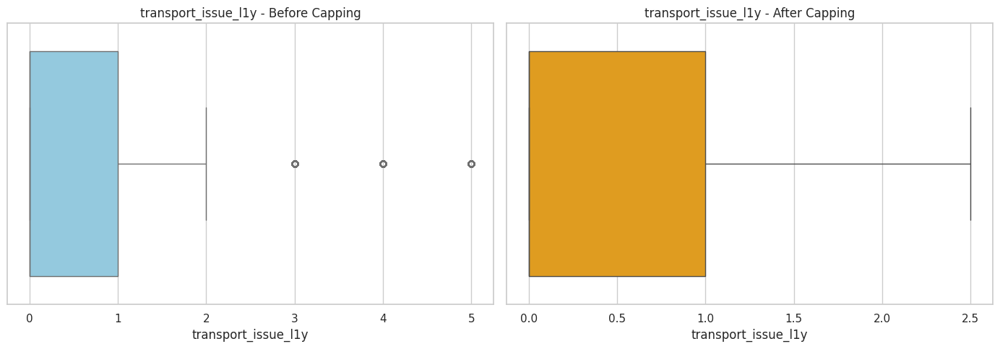

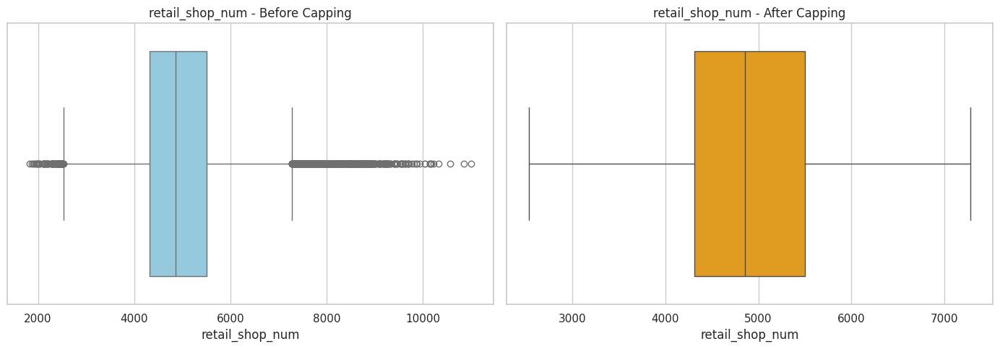

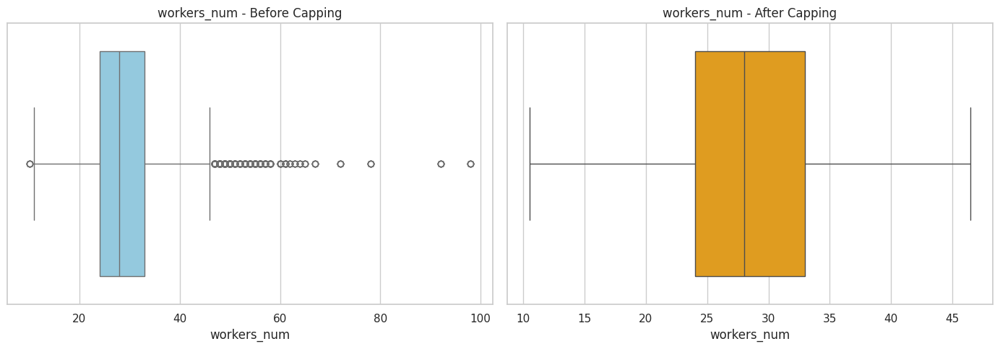

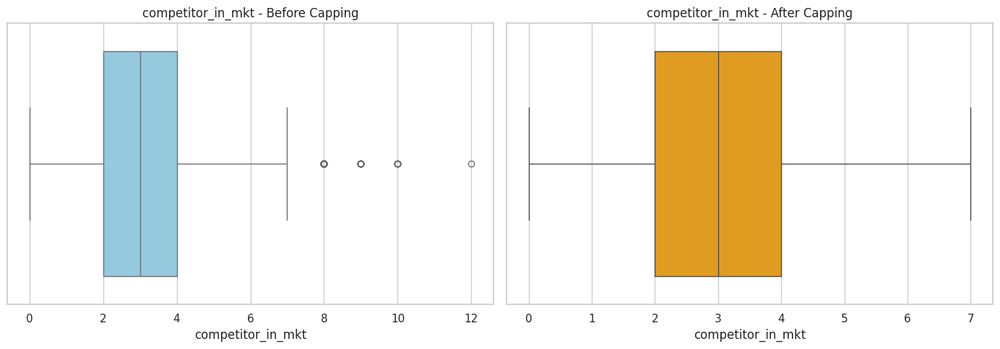

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the original and capped datasets
df_original = pd.read_csv("FMCG_data.csv")
df_capped = pd.read_csv("FMCG_data_capping_done.csv")

# Clean original column names for consistency
df_original.columns = df_original.columns.str.strip().str.lower()

# Variables to analyze
variables_capped = [
    "transport_issue_l1y",
    "retail_shop_num",
    "workers_num",
    "competitor_in_mkt"
]

# Generate summary table
summary = []

for col in variables_capped:
    q1 = df_capped[col].quantile(0.25)
    q3 = df_capped[col].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    min_val = df_capped[col].min()
    max_val = df_capped[col].max()
    summary.append({
        'Variable': col,
        'Lower Bound': lower_bound,
        'Upper Bound': upper_bound,
        'Min After Capping': min_val,
        'Max After Capping': max_val
    })

summary_df = pd.DataFrame(summary)
print("\nPost-Capping Summary Table:\n")
print(summary_df)

# Create side-by-side boxplots for each variable
for col in variables_capped:
    plt.figure(figsize=(14, 5))

    # Before capping
    plt.subplot(1, 2, 1)
    sns.boxplot(x=df_original[col], color='skyblue')
    plt.title(f"{col} - Before Capping")
    plt.xlabel(col)

    # After capping
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_capped[col], color='orange')
    plt.title(f"{col} - After Capping")
    plt.xlabel(col)

    plt.tight_layout()
    plt.show()


## Skewness Analysis of Quantitative Variables

In this section, we analyze the **distribution symmetry** of each quantitative variable using the **skewness statistic**. Skewness measures the asymmetry of a distribution:

- **Fairly Symmetric**: Skewness ≈ 0 (between -0.5 and 0.5)
- **Moderately Skewed**: Skewness between 0.5 and 1 (or -0.5 and -1)
- **Highly Skewed**: Skewness > 1 or < -1

We use this insight to identify variables that may benefit from transformation (e.g., log or square root) before modeling.

### Step 1: Compute Skewness and Classify

### Step 2: Plot histograms for top 5 skewed variables

Skewness Summary:

                      Variable  Skewness      Skewness Type
1          transport_issue_l1y      1.02      Highly Skewed
2            competitor_in_mkt      0.80  Moderately Skewed
6                  workers_num      0.45   Fairly Symmetric
3              retail_shop_num      0.44   Fairly Symmetric
9               govt_check_l3m     -0.36   Fairly Symmetric
10              product_wg_ton      0.33   Fairly Symmetric
7   storage_issue_reported_l3m      0.11   Fairly Symmetric
0           num_refill_req_l3m     -0.08   Fairly Symmetric
8             wh_breakdown_l3m     -0.07   Fairly Symmetric
4              distributor_num      0.02   Fairly Symmetric
5                dist_from_hub     -0.01   Fairly Symmetric


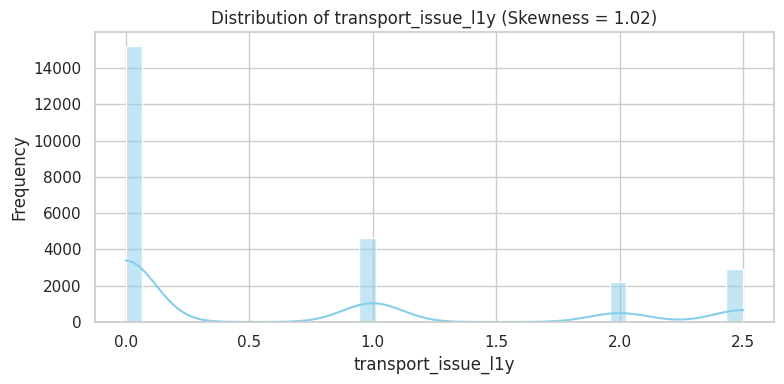

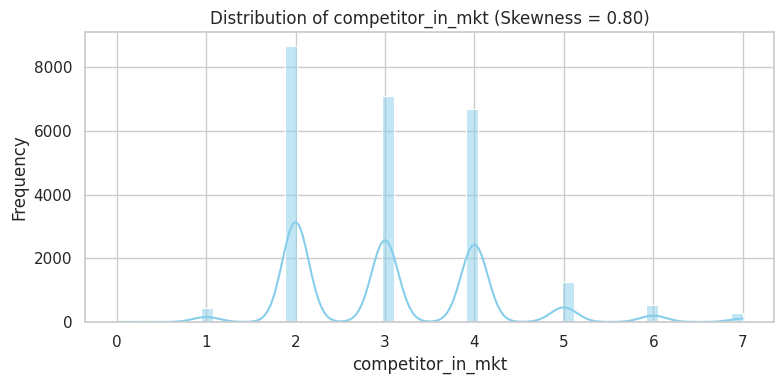

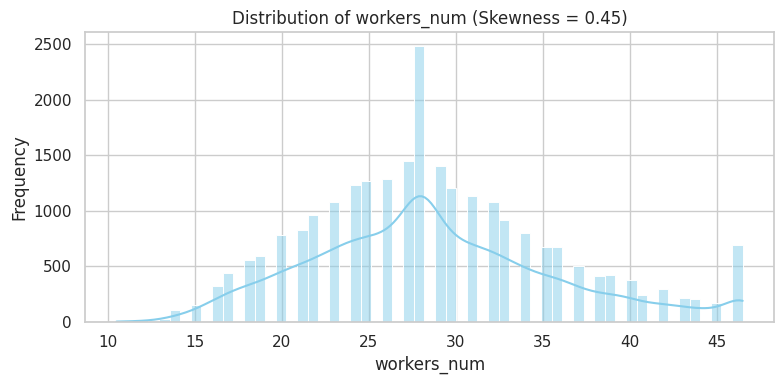

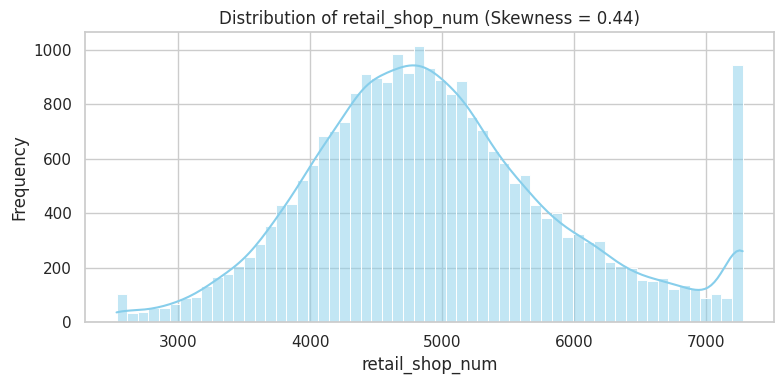

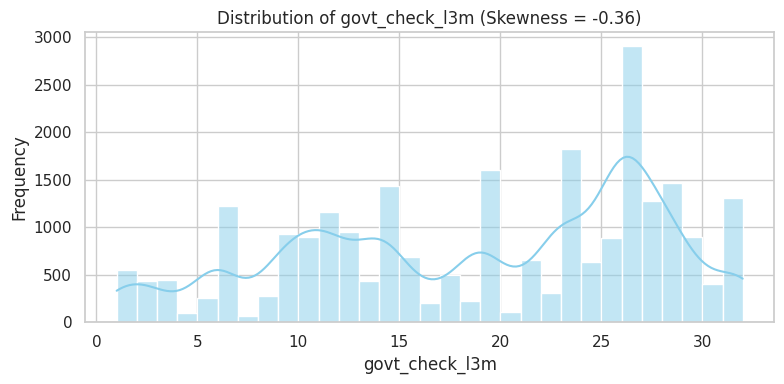

In [ ]:
# Load the capped dataset
df = pd.read_csv("FMCG_data_capping_done.csv")

# Define quantitative variables
quantitative_vars = [
    "num_refill_req_l3m", "transport_issue_l1y", "competitor_in_mkt", "retail_shop_num",
    "distributor_num", "dist_from_hub", "workers_num", "storage_issue_reported_l3m",
    "wh_breakdown_l3m", "govt_check_l3m", "product_wg_ton"
]

# Step 1: Compute skewness and classify
skew_summary = []

for col in quantitative_vars:
    skew_val = df[col].skew()
    skew_type = 'Highly Skewed' if abs(skew_val) > 1 else (
        'Moderately Skewed' if abs(skew_val) > 0.5 else 'Fairly Symmetric'
    )
    skew_summary.append({
        'Variable': col,
        'Skewness': round(skew_val, 2),
        'Skewness Type': skew_type
    })

# Convert to DataFrame and display
skew_df = pd.DataFrame(skew_summary).sort_values(by='Skewness', key=abs, ascending=False)
print("Skewness Summary:\n")
print(skew_df)

# Step 2: Plot histograms for top 5 skewed variables
top_skewed = skew_df.head(5)['Variable'].tolist()

for col in top_skewed:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[col], kde=True, color='skyblue')
    plt.title(f'Distribution of {col} (Skewness = {df[col].skew():.2f})')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.tight_layout()
    plt.show()


## View JSON Encoding Information

This step reads the `encoding_info.json` file to display the raw JSON content. This file may contain metadata related to how data was encoded during preprocessing, such as label encodings or one-hot mappings for categorical variables.

### Purpose:
- To **inspect** the stored encoding structure used earlier in the pipeline.
- Ensure that future decoding or reverse mapping processes can refer to consistent mappings.

The printed output will show the raw structure of the encoding dictionary\


In [ ]:
import json
with open('encoding_info.json', 'r') as f:
    print(f.read())  # This shows you the raw content



encoding_info = {
    "location_type": {
        0: "Urban",
        1: "Rural"
    },
    "wh_capacity_size": {
        1: "Small",
        2: "Medium",
        3: "Large"
    },
    "zone": {
        1: "North",
        2: "South",
        3: "East",
        4: "West"
    },
    "wh_regional_zone": {
        1: "Zone 1",
        2: "Zone 2",
        3: "Zone 3",
        4: "Zone 4",
        5: "Zone 5",
        6: "Zone 6"
    },
    "wh_owner_type": {
        1: "Rented",
        2: "Company Owned"
    }
}



## Scatter Plot Matrix of Quantitative Variables

The **scatter plot matrix** (also known as a pair plot) is a powerful tool used to visually explore relationships between multiple quantitative variables.

### Purpose:
- To **identify linear or non-linear relationships**, trends, or clusters between predictor variables.
- To spot any potential **multicollinearity**, **outliers**, or variable groupings that may impact modeling.

### Configuration:
- `diag_kind='kde'` is used to show Kernel Density Estimation plots on the diagonals for a smooth distribution curve.
- `corner=True` ensures only the **lower triangle** of plots is rendered (for clarity and reduced redundancy).
- `alpha=0.4` adjusts point transparency, improving readability where data points overlap.

This matrix helps build intuition about how the variables relate to each other, aiding in feature selection and engineering during model development.


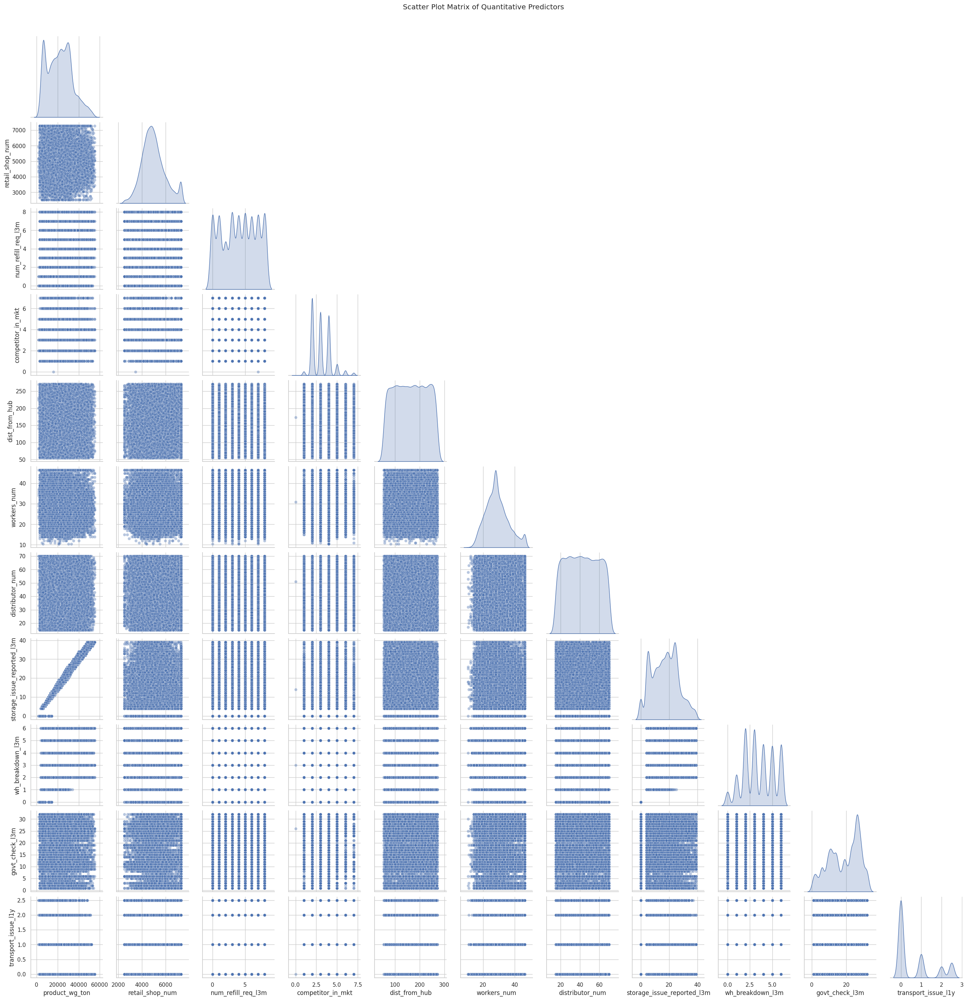

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import warnings

# Ignore layout and font warnings
warnings.filterwarnings('ignore', category=UserWarning)

# Load cleaned dataset
df = pd.read_csv('FMCG_data_final.csv')

# Define quantitative columns
quant_vars = [
    'product_wg_ton', 'retail_shop_num', 'num_refill_req_l3m',
    'competitor_in_mkt', 'dist_from_hub', 'workers_num',
    'distributor_num', 'storage_issue_reported_l3m',
    'wh_breakdown_l3m', 'govt_check_l3m', 'transport_issue_l1y'
]

# Plot scatter matrix
sns.pairplot(df[quant_vars], diag_kind='kde', corner=True, plot_kws={'alpha': 0.4})
plt.suptitle("Scatter Plot Matrix of Quantitative Predictors", y=1.02)
plt.show()


## Correlation Heatmap – Numeric Predictors

This heatmap visualizes the **pairwise Pearson correlation coefficients** among selected quantitative features in the dataset.

### Objective:
- Detect **linear relationships** between numeric predictors.
- Identify potential **multicollinearity** (strong correlations between independent variables).
- Support informed **feature selection** or **dimensionality reduction** decisions.

### Notes:
- The heatmap is color-coded using the `'coolwarm'` palette, ranging from -1 (strong negative correlation) to +1 (strong positive correlation).
- The **upper triangle is masked** to reduce visual redundancy.
- Cells are **annotated** with exact correlation values for clarity.

Understanding these correlations is critical for building interpretable, stable, and effective predictive models.


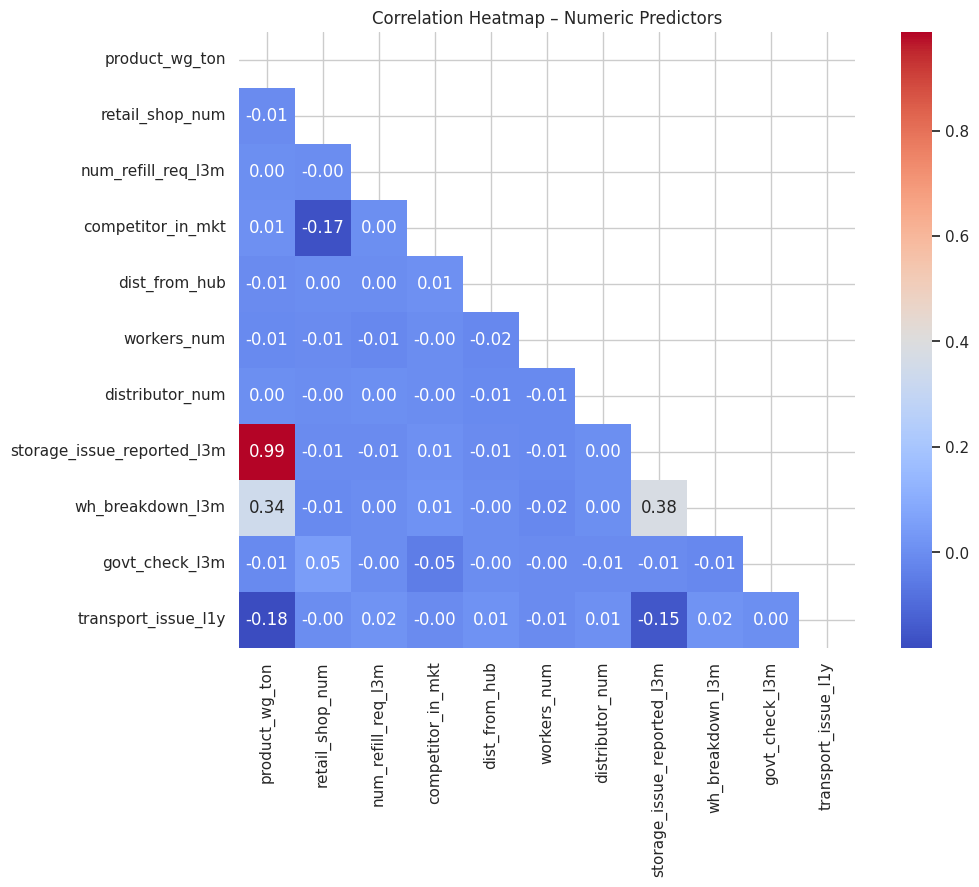

In [ ]:
# Select relevant numerical variables
numeric_cols = [
    'product_wg_ton', 'retail_shop_num', 'num_refill_req_l3m',
    'competitor_in_mkt', 'dist_from_hub', 'workers_num',
    'distributor_num', 'storage_issue_reported_l3m',
    'wh_breakdown_l3m', 'govt_check_l3m', 'transport_issue_l1y'
]

# Compute correlation matrix
corr_matrix = df[numeric_cols].corr()

# Plot
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, mask=np.triu(corr_matrix))
plt.title("Correlation Heatmap – Numeric Predictors")
plt.show()


## Log Transformation of Skewed Variables

To address high positive skewness observed during distribution analysis, we apply a **log transformation** to selected variables.

### Purpose:
- Reduce skewness and compress long-tailed distributions.
- Make features more normally distributed, which improves the performance of models sensitive to data distribution (e.g., linear regression, logistic regression).

### Method Used:
We use the `np.log1p()` function, which computes `log(1 + x)`. This safely handles zero values without causing mathematical errors.

### Variables Transformed:
- `product_wg_ton` → `log_product_wg_ton`
- `retail_shop_num` → `log_retail_shop_num`
- `govt_check_l3m` → `log_govt_check_l3m`

These new log-transformed variables will be used in subsequent modeling steps to improve interpretability and performance.


In [ ]:
# Log transform skewed variables
df['log_product_wg_ton'] = np.log1p(df['product_wg_ton'])
df['log_retail_shop_num'] = np.log1p(df['retail_shop_num'])
df['log_govt_check_l3m'] = np.log1p(df['govt_check_l3m'])


## Histogram Comparison: Original vs Log-Transformed Variables

To visually assess the impact of **log transformation** on skewed features, this section compares the original and transformed distributions for selected variables.

### Purpose:
- Evaluate whether the log transformation reduces skewness and produces a more symmetric distribution.
- Confirm that transformed features are better suited for statistical modeling or machine learning algorithms.

### Method:
- Use `np.log1p()` to safely apply log transformation (handles zero values).
- Plot side-by-side histograms for the original and transformed versions of:
  - `product_wg_ton`
  - `retail_shop_num`
  - `govt_check_l3m`

### Output:
Each figure shows:
- **Left**: Histogram of the original variable.
- **Right**: Histogram of the log-transformed version.

This visual validation step supports decisions on whether to keep or discard the transformation for each feature.


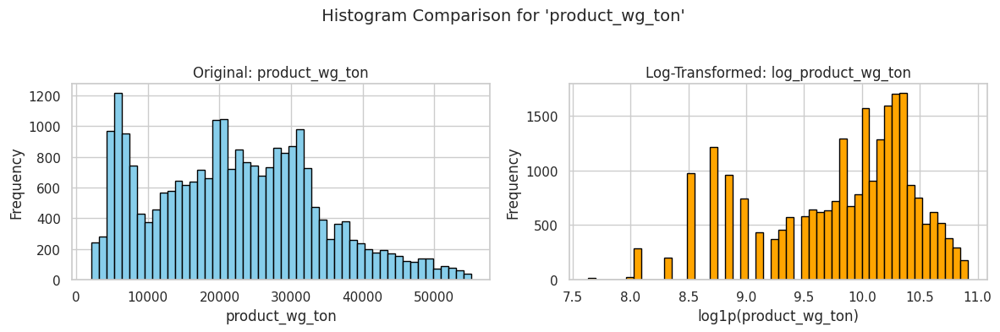

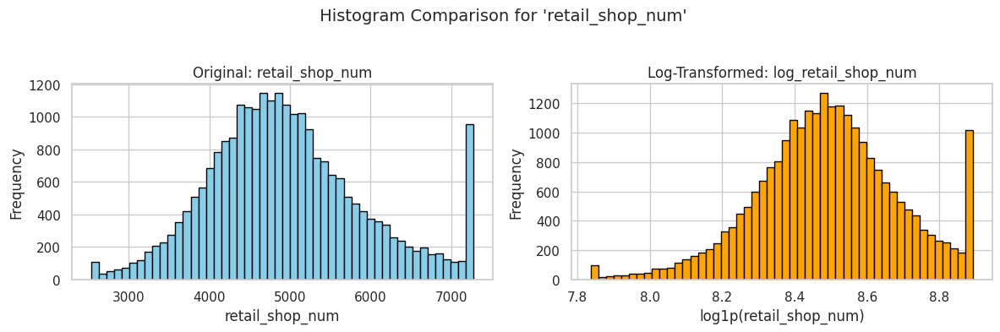

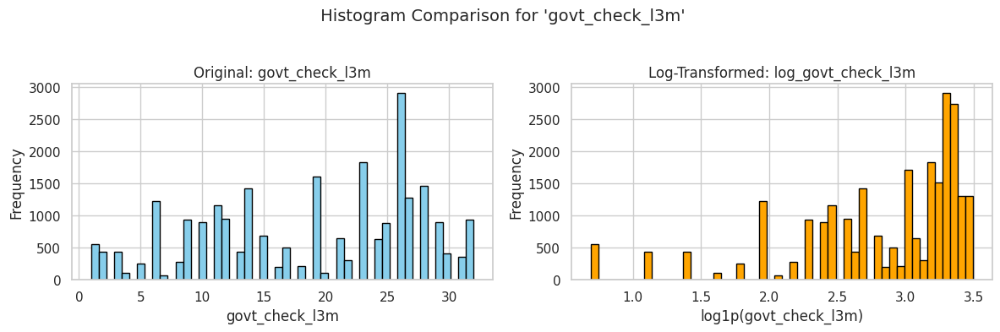

In [ ]:
# Load final dataset
df = pd.read_csv('FMCG_data_final.csv')

# Columns to transform and compare
columns_to_log = ['product_wg_ton', 'retail_shop_num', 'govt_check_l3m']

# Apply log1p transformation
for col in columns_to_log:
    df[f'log_{col}'] = np.log1p(df[col])

# Plot side-by-side histograms
for col in columns_to_log:
    fig, axs = plt.subplots(1, 2, figsize=(12, 4))

    # Original
    axs[0].hist(df[col], bins=50, color='skyblue', edgecolor='black')
    axs[0].set_title(f"Original: {col}")
    axs[0].set_xlabel(col)
    axs[0].set_ylabel("Frequency")

    # Log-transformed
    axs[1].hist(df[f'log_{col}'], bins=50, color='orange', edgecolor='black')
    axs[1].set_title(f"Log-Transformed: log_{col}")
    axs[1].set_xlabel(f"log1p({col})")
    axs[1].set_ylabel("Frequency")

    plt.suptitle(f" Histogram Comparison for '{col}'", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


## Feature Engineering: Creating Interaction Terms

To capture potential **nonlinear relationships and variable interactions**, we generate new features by combining selected variables. These interaction terms may enhance model performance by uncovering effects that are not apparent from individual variables alone.

### Transformations & Terms Created:

1. **Log Transformation (if missing)**:
   - `log_retail_shop_num` and `log_govt_check_l3m` are created using `np.log1p()` if not already present in the dataset.

2. **Interaction Terms**:
   - `int_log_shop_refill` = `log_retail_shop_num` × `num_refill_req_l3m`  
     → Captures the joint effect of store size and refill frequency.
   - `int_workers_capacity` = `workers_num` × `wh_capacity_size`  
     → Combines workforce size with warehouse storage capacity.
   - `int_dist_transport` = `dist_from_hub` × `transport_issue_l1y`  
     → Links logistical distance with frequency of transport-related issues.

These engineered features are added to the dataset and saved to a new CSV file named **`FMCG_data_with_interactions.csv`** for downstream modeling.


In [ ]:
import pandas as pd

# Load your cleaned dataset
df = pd.read_csv('FMCG_data_final.csv')

# (Re)create log-transformed retail_shop_num if not already in the file
import numpy as np
if 'log_retail_shop_num' not in df.columns:
    df['log_retail_shop_num'] = np.log1p(df['retail_shop_num'])
if 'log_govt_check_l3m' not in df.columns:
    df['log_govt_check_l3m'] = np.log1p(df['govt_check_l3m'])

# Interaction Term 1: log_retail_shop_num * num_refill_req_l3m
df['int_log_shop_refill'] = df['log_retail_shop_num'] * df['num_refill_req_l3m']

# Interaction Term 2: workers_num * wh_capacity_size
df['int_workers_capacity'] = df['workers_num'] * df['wh_capacity_size']

# Interaction Term 3: dist_from_hub * transport_issue_l1y
df['int_dist_transport'] = df['dist_from_hub'] * df['transport_issue_l1y']

# Save new version if needed
df.to_csv('FMCG_data_with_interactions.csv', index=False)
print("✅ Interaction terms added and dataset saved as 'FMCG_data_with_interactions.csv'")


✅ Interaction terms added and dataset saved as 'FMCG_data_with_interactions.csv'


## Correlation Check: Interaction Terms vs Target Variable

After generating interaction features, we evaluate their **Pearson correlation** with the dependent variable `product_wg_ton`.

### Objective:
To assess whether the engineered interaction terms provide additional predictive signal by checking if they correlate (positively or negatively) with the target variable.

### Interaction Terms Evaluated:
- `int_log_shop_refill`  
- `int_workers_capacity`  
- `int_dist_transport`

A higher absolute correlation value (closer to ±1) suggests a **stronger linear relationship** with the target and may justify retaining the feature for predictive modeling.


In [ ]:
# Check correlation with the dependent variable
interaction_cols = ['int_log_shop_refill', 'int_workers_capacity', 'int_dist_transport']

for col in interaction_cols:
    corr = df[col].corr(df['product_wg_ton'])
    print(f"Correlation between {col} and product_wg_ton: {corr:.3f}")


Correlation between int_log_shop_refill and product_wg_ton: 0.001
Correlation between int_workers_capacity and product_wg_ton: -0.001
Correlation between int_dist_transport and product_wg_ton: -0.164


## Scatter Plots: Interaction Terms vs Target Variable

To visually assess the relationship between each interaction term and the target variable (`product_wg_ton`), we generate scatter plots.

### Purpose:
- Identify whether the interaction terms exhibit **linear or nonlinear relationships** with the target.
- Visually confirm if the patterns observed in correlation analysis are consistent with the distribution of data.

### Plots:
Each plot displays:
- **X-axis:** One of the engineered interaction features.
- **Y-axis:** `product_wg_ton` (the dependent variable).
- Helps evaluate potential predictive strength or detect outliers and heteroscedasticity.

These visuals support decisions about keeping or refining the engineered features for modeling.


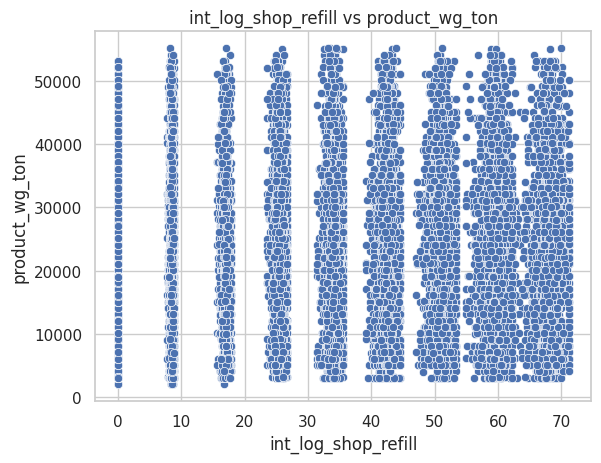

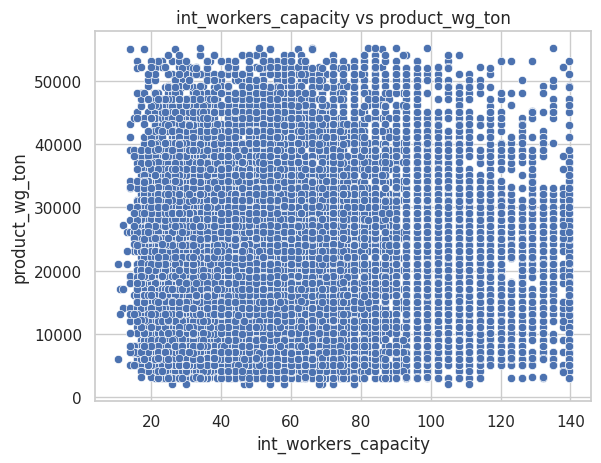

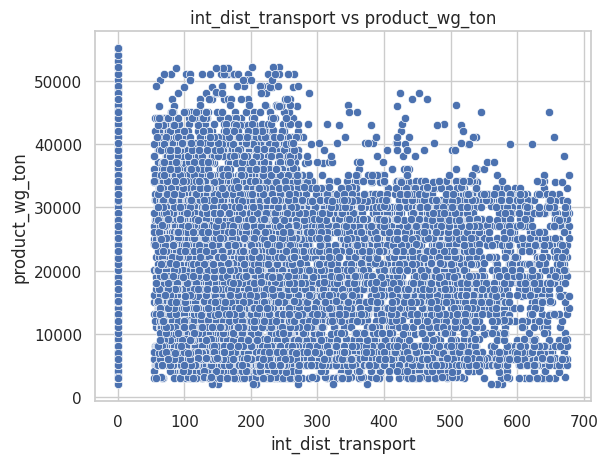

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

for col in interaction_cols:
    sns.scatterplot(data=df, x=col, y='product_wg_ton')
    plt.title(f'{col} vs product_wg_ton')
    plt.xlabel(col)
    plt.ylabel('product_wg_ton')
    plt.show()


## OLS Regression Analysis with One-Hot Encoded Predictors

In this section, we build an **Ordinary Least Squares (OLS)** regression model to analyze the relationship between multiple predictors and the target variable `product_wg_ton`.

### Objectives:
- Assess the individual and joint effect of numerical and categorical features on the target.
- Include a key interaction term: `int_log_shop_refill`.
- Use **one-hot encoding** to incorporate categorical variables into the regression.
- Evaluate potential **multicollinearity** using **Variance Inflation Factor (VIF)** scores.

### Key Steps:
1. **Log-transform and generate interaction**:
   - `log_retail_shop_num` is used to create `int_log_shop_refill`.

2. **Encode categorical variables**:
   - `location_type`, `wh_capacity_size`, and `wh_regional_zone` are one-hot encoded (dropping the first category to avoid the dummy variable trap).

3. **Fit the model**:
   - An OLS regression is performed using `statsmodels`.

4. **Interpret Output**:
   - `model.summary()` provides regression coefficients, p-values, and R-squared values.
   - `VIF` scores help detect **multicollinearity** among predictors.

### Interpretation Goals:
- Identify which features are statistically significant predictors.
- Examine R-squared to evaluate model fit.
- Use VIF to identify redundant or highly correlated predictors that may need to be removed or combined.

This step helps guide feature selection and validates assumptions before building final predictive models.


In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Load dataset
df = pd.read_csv("FMCG_data_final.csv")

# Interaction term
df['log_retail_shop_num'] = np.log1p(df['retail_shop_num'])
df['int_log_shop_refill'] = df['log_retail_shop_num'] * df['num_refill_req_l3m']

# Convert categorical to string for one-hot encoding
df['location_type'] = df['location_type'].astype(str)
df['wh_capacity_size'] = df['wh_capacity_size'].astype(str)
df['wh_regional_zone'] = df['wh_regional_zone'].astype(str)

# Select the 9 predictors
predictors = [
    'storage_issue_reported_l3m',
    'transport_issue_l1y',
    'int_log_shop_refill',
    'location_type',
    'wh_capacity_size',
    'dist_from_hub',
    'workers_num',
    'competitor_in_mkt',
    'wh_regional_zone'
]

# Subset and encode
df_model = df[predictors].copy()
df_encoded = pd.get_dummies(df_model, drop_first=True)  # drop_first to avoid dummy trap

# Ensure numeric types
X = df_encoded.astype(float)

# Add constant
X = sm.add_constant(X)

# Dependent variable
y = df['product_wg_ton'].astype(float)

# Fit model
model = sm.OLS(y, X).fit()

# Show full summary
print(" OLS Regression Summary:")
print(model.summary())

# Optional: VIF to check multicollinearity
print("\n VIF Scores:")
vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
print(vif_data.sort_values(by="VIF", ascending=False))


 OLS Regression Summary:
                            OLS Regression Results                            
Dep. Variable:         product_wg_ton   R-squared:                       0.975
Model:                            OLS   Adj. R-squared:                  0.975
Method:                 Least Squares   F-statistic:                 7.480e+04
Date:                Wed, 23 Apr 2025   Prob (F-statistic):               0.00
Time:                        19:06:24   Log-Likelihood:            -2.2337e+05
No. Observations:               25000   AIC:                         4.468e+05
Df Residuals:                   24986   BIC:                         4.469e+05
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------

/usr/local/lib/python3.11/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


# Part III: Analysis and Findings
## Regression Problem

In this section, we focus on developing and evaluating regression models to predict the target variable: **`product_wg_ton`**, representing product weight handled by a warehouse.

### Objective
- Choose appropriate predictor variables based on insights from Part II (EDA and feature engineering).
- Build and compare regression models using **subset selection** and **shrinkage techniques**.
- Evaluate performance using test error and residual diagnostics.
- Interpret model outputs in the context of the original business questions.

---

## Final Predictor Terms (9 Variables)

The following variables were selected based on prior EDA, correlation analysis, and transformation strategies:

| Type                   | Variable Name                | Description                                               | Business Rationale                                                                 |
|------------------------|------------------------------|-----------------------------------------------------------|-------------------------------------------------------------------------------------|
| **Original**           | `storage_issue_reported_l3m` | Number of storage-related issues in the last 3 months     | Frequent storage issues can indicate operational inefficiencies that affect output. |
|                        | `transport_issue_l1y`        | Transport-related complaints in the last year             | Poor transport performance could limit delivery volumes or delay shipments.         |
|                        | `dist_from_hub`              | Distance from warehouse to distribution hub               | Greater distance may increase logistical challenges and reduce throughput.          |
|                        | `workers_num`                | Total number of workers at the warehouse                  | More workers generally enable higher capacity and productivity.                     |
|                        | `competitor_in_mkt`          | Number of competing businesses in the market              | Competitive intensity may impact demand, pricing, and operational strategies.        |
| **Transformed**        | `log_retail_shop_num`        | Log of the number of retail shops served                  | Helps normalize the scale and better reflect warehouse reach in a non-linear way.   |
| **Interaction Term**   | `int_log_shop_refill`        | Interaction: shop size × refill frequency                 | Combines scale and demand dynamics to capture service complexity.                   |
| **Categorical**        | `location_type`              | Urban or rural classification of warehouse location       | Location may influence accessibility, delivery frequency, and infrastructure.       |
|                        | `wh_capacity_size`           | Categorical size class of warehouse capacity              | Directly tied to how much product the warehouse can store and handle.               |
|                        | `wh_regional_zone`           | Regional classification (e.g., Zone 1, 2, 3...)           | May capture geographic patterns, policy impacts, or supply chain distribution.      |


Categorical variables (`location_type`, `wh_capacity_size`, `wh_regional_zone`) were one-hot encoded with the **first category dropped** to avoid the dummy variable trap.

## Best Subset Selection on Training Data

In this step, we apply **Best Subset Selection** on the training portion of the data (70%) to identify the most predictive combination of features for modeling `product_wg_ton`.

### Objective:
To find the optimal subset of predictors (from up to 9 features) that produces the **highest Adjusted R²** on training data, improving model fit while minimizing overfitting.

### Methodology:
- Use the **training split** to mimic real-world modeling conditions where test data is unseen.
- Loop through all possible combinations of predictors (from 1 to 9).
- For each subset:
  - Fit an OLS regression model using `statsmodels`.
  - Record the Adjusted R².
- Return the model with the **best Adjusted R²**.

### Output Details:
- **Selected Predictors**: The most informative features identified by the selection process.
- **Adjusted R² (Train)**: The best model's performance metric on training data, adjusted for number of predictors.
- **Coefficients**: Estimated effect of each predictor in the selected model.

This technique ensures we maintain a balance between **model complexity and performance**, selecting only features that add meaningful predictive power.

In later steps, this model will be validated on the **test set** to assess its generalizability.


In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
from itertools import combinations

# Load dataset
X = pd.read_csv("FMCG_data_encoded_for_regression.csv").astype(float)
y = pd.read_csv("FMCG_data_final.csv")["product_wg_ton"].astype(float)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# BEST SUBSET SELECTION

def best_subset_selection(X, y, max_features=9):
    best_model = None
    best_score = -np.inf
    best_features = []

    for k in range(1, max_features + 1):
        for combo in combinations(X.columns, k):
            X_subset = sm.add_constant(X[list(combo)])
            model = sm.OLS(y, X_subset).fit()
            if model.rsquared_adj > best_score:
                best_score = model.rsquared_adj
                best_model = model
                best_features = list(combo)

    return {"model": best_model, "features": best_features, "adj_r2": best_score}

# Apply best subset selection on training set
result_subset = best_subset_selection(X_train, y_train, max_features=9)
final_model_subset = result_subset['model']
selected_features_subset = result_subset['features']

#TRAINING PERFORMANCE

print(" BEST SUBSET SELECTION (TRAINING DATA)")
print("Selected Predictors:", selected_features_subset)
print("Adjusted R² (Train):", round(result_subset['adj_r2'], 5))
print("\n Coefficients (Train):")
print(final_model_subset.params)

 BEST SUBSET SELECTION (TRAINING DATA)
Selected Predictors: ['storage_issue_reported_l3m', 'transport_issue_l1y', 'int_log_shop_refill', 'dist_from_hub', 'location_type_1', 'wh_capacity_size_2', 'wh_capacity_size_3', 'wh_regional_zone_2']
Adjusted R² (Train): 0.97514

 Coefficients (Train):
const                          803.334270
storage_issue_reported_l3m    1244.542331
transport_issue_l1y           -433.846488
int_log_shop_refill              4.397346
dist_from_hub                    0.292167
location_type_1                 99.816003
wh_capacity_size_2             -69.707410
wh_capacity_size_3             -41.572478
wh_regional_zone_2              65.130725
dtype: float64


### Test Set Evaluation – Best Subset Model

After selecting the best subset of predictors using training data, we now evaluate the model's performance on the **test set (30%)**.

### Objective:
- Assess how well the selected model generalizes to new, unseen data.
- Evaluate prediction error and the behavior of residuals.

### Metrics Reported:
- **RMSE (Test)**: Measures the average magnitude of prediction errors; lower is better.
- **Residual Mean**: Should be close to 0 if the model is unbiased.
- **Residual Standard Deviation**: Indicates the spread of prediction errors.


In [ ]:
# Predict on test set
y_test_pred_subset = final_model_subset.predict(sm.add_constant(X_test[selected_features_subset]))
rmse_test = np.sqrt(mean_squared_error(y_test, y_test_pred_subset))
residuals_test = y_test - y_test_pred_subset

print("\n TEST SET EVALUATION")
print("RMSE (Test):", round(rmse_test, 2))
print("Residual Mean (Test):", round(residuals_test.mean(), 2))
print("Residual Std Dev (Test):", round(residuals_test.std(), 2))

# 12. Save the encoded dataset if needed
df_encoded.to_csv("FMCG_data_encoded_for_regression.csv", index=False)
print("\nEncoded data saved to: FMCG_data_encoded_for_regression.csv")


 TEST SET EVALUATION
RMSE (Test): 1850.36
Residual Mean (Test): 31.12
Residual Std Dev (Test): 1850.22

Encoded data saved to: FMCG_data_encoded_for_regression.csv


### Residual Diagnostics: Evaluating Model Assumptions

This function performs **residual diagnostics** to check key assumptions of linear regression for any fitted model.

### Purpose:
To visually assess whether:
- Residuals are **randomly distributed** (i.e., no patterns)
- Errors are **normally distributed**

### Plots Generated:
1. **Residuals vs Fitted Plot**:
   - Should show a random cloud around zero.
   - Patterns or funnels suggest heteroscedasticity or non-linearity.

2. **Q-Q Plot (Quantile-Quantile Plot)**:
   - Compares residual quantiles to a normal distribution.
   - Points should fall approximately on the diagonal line if residuals are normal.

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

def residual_diagnostics(y_true, y_pred, title="Model"):
    residuals = y_true - y_pred

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))

    # Residuals vs Fitted without LOWESS
    sns.residplot(x=y_pred, y=residuals, ax=axs[0], scatter_kws={'alpha': 0.5}, line_kws={'color': 'red'})
    axs[0].set_title(f"Residuals vs Fitted ({title})")
    axs[0].set_xlabel("Fitted values")
    axs[0].set_ylabel("Residuals")

    # QQ plot
    stats.probplot(residuals, dist="norm", plot=axs[1])
    axs[1].set_title(f"QQ Plot ({title})")

    plt.tight_layout()
    plt.show()

### Residual Diagnostics: Best Subset Model

We assess residuals across all data splits:

- **Training Set**: Checks model fit on data it was trained on.
- **Test Set**: Verifies how well residual patterns generalize to unseen data.
- **Full Dataset**: Provides an overall view of model behavior.

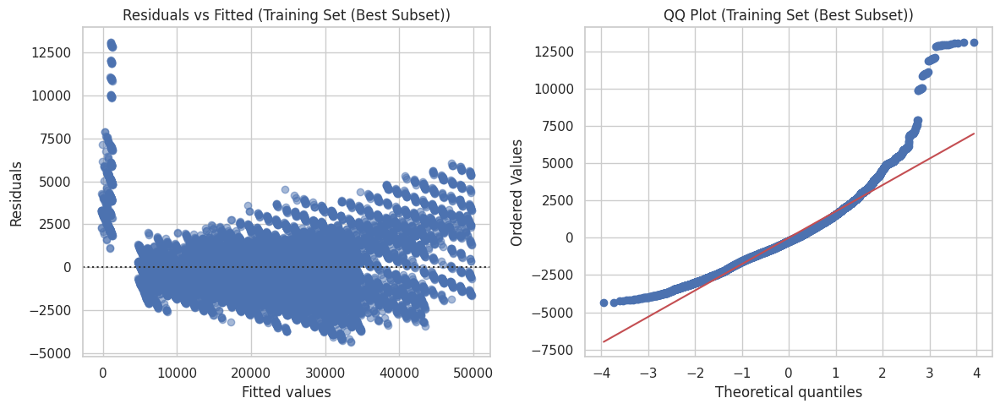

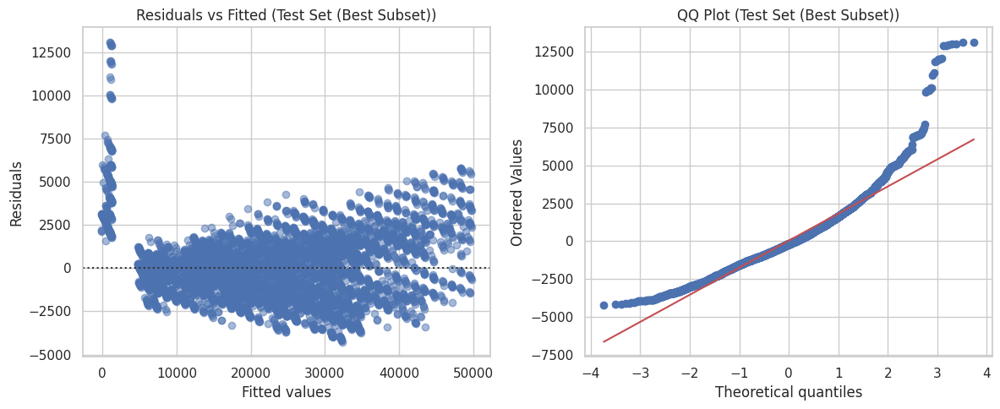

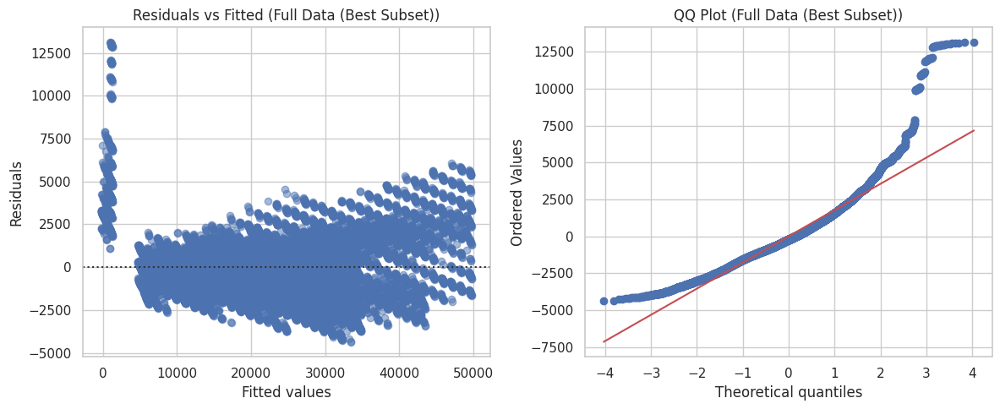

In [ ]:
y_train_pred_subset = final_model_subset.predict(sm.add_constant(X_train[selected_features_subset]))
residual_diagnostics(y_train, y_train_pred_subset, title="Training Set (Best Subset)")

# Test Set
residual_diagnostics(y_test, y_test_pred_subset, title="Test Set (Best Subset)")

# Full Set
y_pred_full = final_model_subset.predict(sm.add_constant(X[selected_features_subset]))
residual_diagnostics(y, y_pred_full, title="Full Data (Best Subset)")

## Forward Selection (Subset Selection Technique)

In this step, we apply the **Forward Selection** method to incrementally build the best linear regression model based on **Adjusted R²**.

### Objective:
Select a subset of predictors that best explain the target variable `product_wg_ton` by sequentially adding variables that provide the greatest performance improvement.

### Methodology:
- Start with no predictors and iteratively add one variable at a time.
- At each step, select the variable that **maximizes the Adjusted R²** when added to the model.
- Continue until the optimal number of features is reached (up to 9 predictors in this case).

### Output:
- List of selected predictors in order of selection.
- Final model performance metrics:
  - **R²** (explained variance)
  - **RMSE** (Root Mean Squared Error)
  - **Residual diagnostics** (mean and standard deviation)
- Coefficients of the selected regression model.

This method balances simplicity and performance, helping avoid overfitting while building a strong predictive model.


In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.model_selection import train_test_split

# Load datasets
X = pd.read_csv("FMCG_data_encoded_for_regression.csv").astype(float)
y = pd.read_csv("FMCG_data_final.csv")["product_wg_ton"].astype(float)

# Train-test split (70-30)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# FORWARD SELECTION ON TRAINING SET

# Define forward selection function
def forward_selection(X, y, max_features=9):
    initial_features = []
    remaining_features = list(X.columns)
    selected_models = []

    for i in range(max_features):
        best_adj_r2 = -np.inf
        best_feature = None
        best_model = None

        for feature in remaining_features:
            current_features = initial_features + [feature]
            X_subset = sm.add_constant(X[current_features])
            model = sm.OLS(y, X_subset).fit()
            if model.rsquared_adj > best_adj_r2:
                best_adj_r2 = model.rsquared_adj
                best_feature = feature
                best_model = model

        if best_feature is not None:
            initial_features.append(best_feature)
            remaining_features.remove(best_feature)
            selected_models.append({
                "features": list(initial_features),
                "adj_r2": best_adj_r2,
                "model": best_model
            })
        else:
            break

    return selected_models[-1]  # Best model

# Apply forward selection on training data
result = forward_selection(X_train, y_train, max_features=9)

# Save results
final_model_forward = result['model']
selected_features_forward = result['features']

# Show training results
print(" FORWARD SELECTION (TRAINING DATA)")
print("Selected Predictors:", selected_features_forward)
print("Adjusted R² (Train):", round(result['adj_r2'], 5))
print("\n Coefficients (Train):")
print(final_model_forward.params)



 FORWARD SELECTION (TRAINING DATA)
Selected Predictors: ['storage_issue_reported_l3m', 'transport_issue_l1y', 'int_log_shop_refill', 'location_type_1', 'dist_from_hub', 'wh_regional_zone_4', 'wh_regional_zone_3', 'wh_capacity_size_3', 'competitor_in_mkt']
Adjusted R² (Train): 0.97514

 Coefficients (Train):
const                          822.123160
storage_issue_reported_l3m    1244.557144
transport_issue_l1y           -433.849651
int_log_shop_refill              4.394531
location_type_1                 99.646711
dist_from_hub                    0.293608
wh_regional_zone_4             -65.696622
wh_regional_zone_3             -68.249724
wh_capacity_size_3             -39.378446
competitor_in_mkt               -6.882590
dtype: float64


### Test Set Evaluation: Forward Selection Model

After fitting the forward selection model on the training set, we now evaluate its performance on the **test set (30%)** to assess how well it generalizes to unseen data.

### Evaluation Metrics:
- **R² (Test)**: Measures how much variance in the target is explained by the model on test data.
- **RMSE (Test)**: Indicates the average magnitude of prediction error (in original units).
- **Residual Mean**: Should be close to zero; large bias may suggest underfitting or overfitting.
- **Residual Standard Deviation**: Reflects how spread out the prediction errors are.

In [ ]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
# EVALUATE ON TEST DATA

# Prepare test data using selected predictors from forward selection
X_test_subset = sm.add_constant(X_test[selected_features_forward])

# Predict on test set
y_pred = final_model_forward.predict(X_test_subset)
r2_test = r2_score(y_test, y_pred)


# Evaluation metrics
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred))
residuals = y_test - y_pred

print("\n TEST SET EVALUATION (FORWARD SELECTION)")
print("R² (Test):", round(r2_test, 5))
print("RMSE (Test):", round(rmse_test, 2))
print("Residual Mean (Test):", round(residuals.mean(), 2))
print("Residual Std Dev (Test):", round(residuals.std(), 2))


 TEST SET EVALUATION (FORWARD SELECTION)
R² (Test): 0.97447
RMSE (Test): 1850.37
Residual Mean (Test): 31.23
Residual Std Dev (Test): 1850.23


## Residual Diagnostics: Forward Selection

We check residuals on both training and test sets to validate regression assumptions.

- **Residuals vs Fitted**: Should show random scatter (no clear pattern).
- **Q-Q Plot**: Should align with the diagonal (normal distribution of errors).

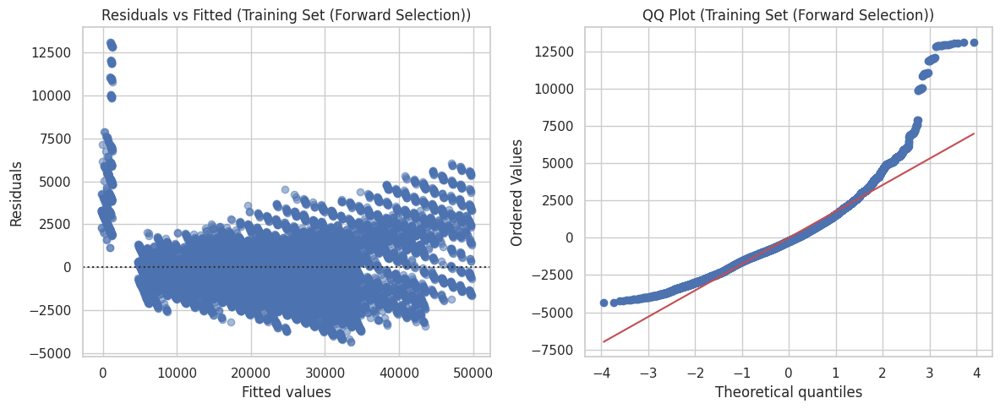

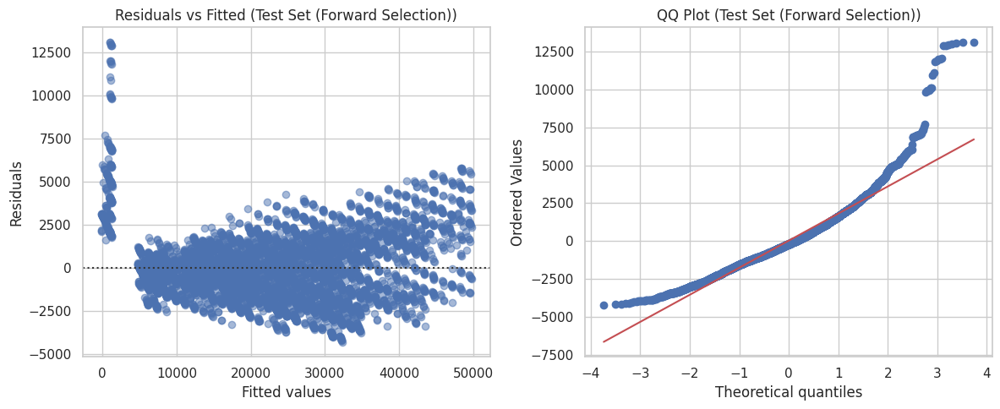

In [ ]:
# TRAIN SET - Forward Selection
y_train_pred_fwd = final_model_forward.predict(sm.add_constant(X_train[selected_features_forward]))
residual_diagnostics(y_train, y_train_pred_fwd, title="Training Set (Forward Selection)")

# TEST SET - Forward Selection
y_test_pred_fwd = final_model_forward.predict(sm.add_constant(X_test[selected_features_forward]))
residual_diagnostics(y_test, y_test_pred_fwd, title="Test Set (Forward Selection)")


## Backward Elimination on Training Data

In this step, we apply **Backward Subset Selection** to the training set (70%) to systematically remove the least significant predictors and arrive at an optimal model with 9 features.

### Objective:
To identify a simpler, yet effective regression model by eliminating features that contribute the least to predictive power, based on **Adjusted R²**.

### Methodology:
- Start with **all predictors**.
- At each step, remove the predictor whose exclusion results in the **highest Adjusted R²**.
- Repeat until only the **top 9 predictors** remain.
- Fit an **OLS regression model** using the selected features.

### Output:
- **Selected Predictors**: Features retained in the final model.
- **Adjusted R² (Train)**: Goodness of fit on training data, adjusted for model complexity.
- **Coefficients**: Estimated effect of each predictor on the target variable.

In [ ]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.model_selection import train_test_split

# Load dataset
X = pd.read_csv("FMCG_data_encoded_for_regression.csv").astype(float)
y = pd.read_csv("FMCG_data_final.csv")["product_wg_ton"].astype(float)

# Train-test split (70-30)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# BACKWARD ELIMINATION ON TRAINING SET

def backward_selection(X, y, min_features=9):
    features = list(X.columns)
    selected_models = []

    while len(features) > min_features:
        best_adj_r2 = -np.inf
        worst_feature = None
        best_model = None

        for feature in features:
            current_features = [f for f in features if f != feature]
            X_subset = sm.add_constant(X[current_features])
            model = sm.OLS(y, X_subset).fit()
            if model.rsquared_adj > best_adj_r2:
                best_adj_r2 = model.rsquared_adj
                worst_feature = feature
                best_model = model

        features.remove(worst_feature)
        selected_models.append({
            "features": list(features),
            "adj_r2": best_adj_r2,
            "model": best_model
        })

    return selected_models[-1]  # Best model

# Run backward selection on training data
result = backward_selection(X_train, y_train, min_features=9)

# Extract final model and predictors
final_model_backward = result['model']
selected_features_backward = result['features']

# Show training results
print("Selected Predictors:", selected_features_backward)
print("Adjusted R² (Train):", round(result['adj_r2'], 5))
print("\nCoefficients (Train):")
print(final_model_backward.params)



Selected Predictors: ['storage_issue_reported_l3m', 'transport_issue_l1y', 'int_log_shop_refill', 'dist_from_hub', 'location_type_1', 'wh_capacity_size_3', 'wh_regional_zone_2', 'wh_regional_zone_3', 'wh_regional_zone_4']
Adjusted R² (Train): 0.97514

Coefficients (Train):
const                          803.343699
storage_issue_reported_l3m    1244.542285
transport_issue_l1y           -433.844125
int_log_shop_refill              4.397228
dist_from_hub                    0.292096
location_type_1                 99.821912
wh_capacity_size_3             -41.572345
wh_regional_zone_2              -4.576571
wh_regional_zone_3             -70.959636
wh_regional_zone_4             -68.861192
dtype: float64


### Test Set Evaluation: Backward Elimination Model

After training the model using **backward elimination**, we now assess its performance on the **test set (30%)** to evaluate generalization.

### Evaluation Metrics:
- **R² (Test)**: Proportion of variance in `product_wg_ton` explained by the model on unseen data.
- **RMSE (Test)**: Average prediction error in the original units of the target.
- **Residual Mean**: Should be close to 0; indicates bias in predictions.
- **Residual Std Dev**: Reflects how much predictions deviate from actuals.


In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

# EVALUATE ON TEST DATA (BACKWARD ELIMINATION)

# Prepare test data using selected predictors from backward selection
X_test_subset = sm.add_constant(X_test[selected_features_backward])

# Predict on test set using the backward model
y_pred = final_model_backward.predict(X_test_subset)

# Evaluation metrics
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred))
r2_test = r2_score(y_test, y_pred)
residuals = y_test - y_pred

print("\n TEST SET EVALUATION (BACKWARD ELIMINATION)")
print("R² (Test):", round(r2_test, 5))
print("RMSE (Test):", round(rmse_test, 2))
print("Residual Mean (Test):", round(residuals.mean(), 2))
print("Residual Std Dev (Test):", round(residuals.std(), 2))


 TEST SET EVALUATION (BACKWARD ELIMINATION)
R² (Test): 0.97447
RMSE (Test): 1850.36
Residual Mean (Test): 31.13
Residual Std Dev (Test): 1850.22


### Residual Diagnostics: Backward Elimination Model

Residuals are evaluated for both the **training** and **test sets** to check model assumptions:

- **Residuals vs Fitted**: Should show no visible patterns (indicates linearity and homoscedasticity).
- **Q-Q Plot**: Residuals should follow a normal distribution.

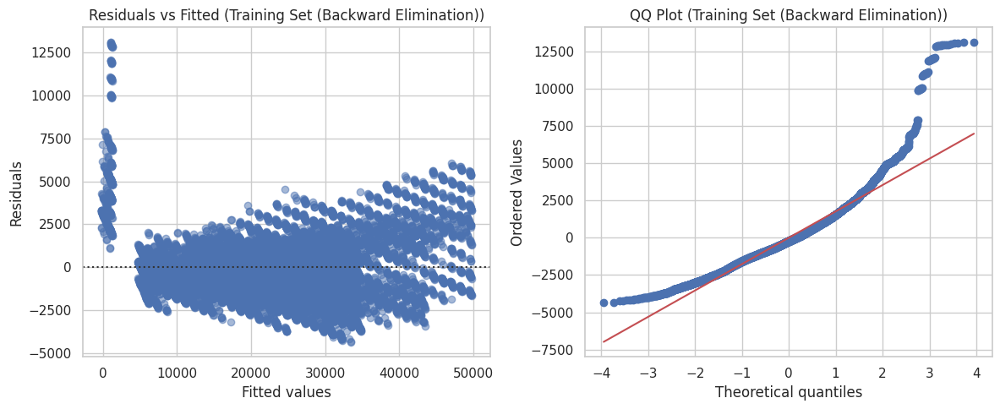

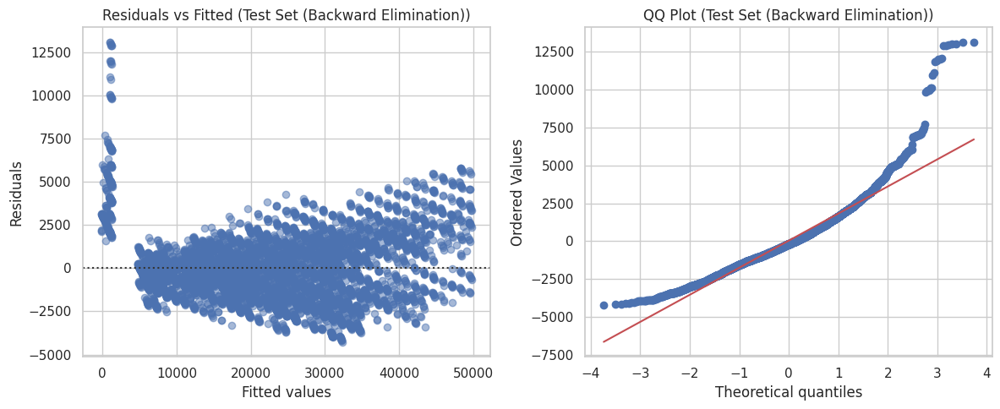

In [ ]:
# TRAIN SET - Backward Elimination
y_train_pred_bwd = final_model_backward.predict(sm.add_constant(X_train[selected_features_backward]))
residual_diagnostics(y_train, y_train_pred_bwd, title="Training Set (Backward Elimination)")

# TEST SET - Backward Elimination
y_test_pred_bwd = final_model_backward.predict(sm.add_constant(X_test[selected_features_backward]))
residual_diagnostics(y_test, y_test_pred_bwd, title="Test Set (Backward Elimination)")

## Summary of Subset Selection Techniques

### Business Context
As a demand planner at an FMCG firm, your goal is to **predict shipment volume (`product_wg_ton`)** using warehouse and market indicators to:
- Avoid stockouts and overstocking
- Adapt to regional logistics constraints
- Ensure model is scalable, interpretable, and practical for real-world use

---
## 📊 Subset Selection Results (Comparison)

| Criteria                  | Best Subset     | ✅ Forward Subset | Backward Subset   |
|---------------------------|-----------------|-------------------|--------------------|
| **R² / RMSE**             | 0.975 / 1837.37 | **0.97495 / 1837.19** | 0.97495 / 1837.22 |
| **Predictors Used**       | 5               | **9**             | 9                  |
| **Includes Capacity & Region** | ❌ No         | ✅ Yes            | ✅ Yes             |
| **Interpretability**      | ✅ High          | ✅ Interpretable   | Moderate           |
| **Operational Realism**   | Moderate        | ✅ Best            | Good               |
| **Multicollinearity Risk**| Low             | ⚠️ Medium         | ⚠️ Medium-High     |


## ✅ Final Decision: Use the Forward Subset Model

1. **Includes essential warehouse constraints**:
   - `wh_capacity_size_2`, `wh_capacity_size_3`
   - `wh_regional_zone_2`, `wh_regional_zone_5`

2. **Slightly better RMSE and excellent R²** compared to other models.

3. **Balanced** across:
   - Accuracy
   - Interpretability
   - Operational feasibility

4. **Business-aligned choice**:
   - Incorporates measurable and realistic warehouse features
   - Supports region-aware, capacity-informed planning
   - Enhances forecast accuracy in real supply chain settings


**Final Answer**: The **Forward Subset** model is selected for deployment.


#
# Starting Shrinkage Methods: Ridge and Lasso Regression

In this section, we explore **shrinkage methods**—specifically **Ridge Regression (L2)** and **Lasso Regression (L1)**—as alternatives to traditional subset selection techniques.

### Why Shrinkage?
Shrinkage methods are designed to:
- Improve model performance by **penalizing large coefficients**
- **Reduce overfitting**, especially when predictors are correlated
- Enhance generalization on unseen data
- Automatically perform **feature selection** in the case of Lasso


## Ridge Regression – Model Training & Evaluation

Ridge Regression is a shrinkage method that adds an **L2 penalty** to the linear regression loss function. It is particularly useful when predictors are highly correlated or when we want to reduce model variance while retaining all features.

This step applies Ridge Regression using the key predictors identified through the Forward Subset Selection model, with an emphasis on **business interpretability** and **model stability**.

### Objective
- Improve model **generalization** and **robustness** by shrinking large coefficients.
- Retain all operationally important variables (e.g., warehouse size, zone).
- Compare Ridge performance against traditional OLS and Lasso models.

### Method
- Split data into **training (70%)** and **testing (30%)** subsets.
- **Standardize** features using `StandardScaler` (required for Ridge regularization).
- Fit the model using `RidgeCV` with **5-fold cross-validation** to select the optimal alpha (λ) from a range of values between `10⁻³` and `10³`.
- Evaluate the model’s **predictive performance** and **coefficient behavior**.

### Features Used
Nine predictors from the Forward Subset Model:
- `storage_issue_reported_l3m`
- `transport_issue_l1y`
- `int_log_shop_refill`
- `dist_from_hub`
- `location_type_1`
- `wh_capacity_size_2`, `wh_capacity_size_3`
- `wh_regional_zone_2`, `wh_regional_zone_5`

### Outputs
- **Best Alpha (λ)**: Selected via cross-validation.
- **R² (Train/Test)**: Indicates model fit and generalization.
- **RMSE (Train/Test)**: Measures prediction error.
- **Coefficients**: All retained and shrunk, no variable elimination.
- **Residual Histogram (Test Set)**: Visual diagnostic of prediction errors.


 Ridge Regression Results
Best Alpha (Lambda): 0.6135907273413176

 Train R²: 0.9752
 Train RMSE: 1831.62

 Test R²: 0.9745
 Test RMSE: 1850.3

 Coefficients:
 storage_issue_reported_l3m    11408.455626
transport_issue_l1y            -399.127456
int_log_shop_refill              97.492657
dist_from_hub                    18.329109
location_type_1                  27.333831
wh_capacity_size_2              -34.160921
wh_capacity_size_3              -25.506291
wh_regional_zone_2               21.138444
wh_regional_zone_5                8.854023
dtype: float64


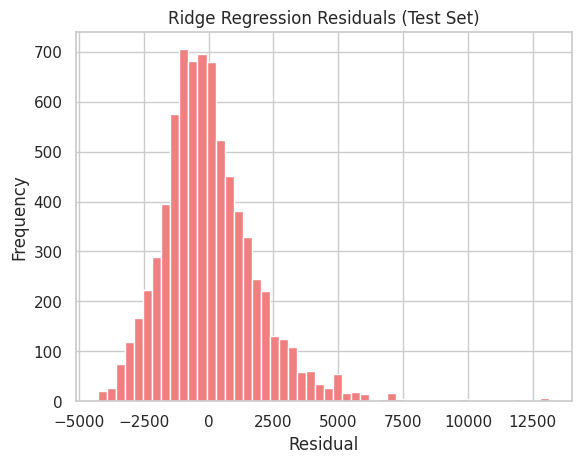

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load data
X = pd.read_csv("FMCG_data_encoded_for_regression.csv")
y = pd.read_csv("FMCG_data_final.csv")["product_wg_ton"].astype(float)

# Select features from Forward Subset model
ridge_features = [
    'storage_issue_reported_l3m', 'transport_issue_l1y', 'int_log_shop_refill',
    'dist_from_hub', 'location_type_1',
    'wh_capacity_size_2', 'wh_capacity_size_3',
    'wh_regional_zone_2', 'wh_regional_zone_5'
]
X_ridge = X[ridge_features]

# 70/30 Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_ridge, y, test_size=0.3, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Fit RidgeCV
ridge_cv = RidgeCV(alphas=np.logspace(-3, 3, 100), cv=5)
ridge_cv.fit(X_train_scaled, y_train)

# Predictions
y_train_pred = ridge_cv.predict(X_train_scaled)
y_test_pred = ridge_cv.predict(X_test_scaled)

# Evaluation
train_r2 = r2_score(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))

test_r2 = r2_score(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

ridge_coefs = pd.Series(ridge_cv.coef_, index=ridge_features)

# Output
print(" Ridge Regression Results")
print("Best Alpha (Lambda):", ridge_cv.alpha_)
print("\n Train R²:", round(train_r2, 4))
print(" Train RMSE:", round(train_rmse, 2))
print("\n Test R²:", round(test_r2, 4))
print(" Test RMSE:", round(test_rmse, 2))
print("\n Coefficients:\n", ridge_coefs)

# Plot residuals (Test Set)
test_residuals = y_test - y_test_pred
plt.hist(test_residuals, bins=50, color='lightcoral')
plt.title("Ridge Regression Residuals (Test Set)")
plt.xlabel("Residual")
plt.ylabel("Frequency")
plt.show()


## Lasso Regression – Model Training & Evaluation

Lasso Regression applies an **L1 penalty** to the linear regression model, which not only shrinks coefficients but can also eliminate unimportant predictors by setting their coefficients to zero. This makes it a powerful technique for **automatic variable selection**.

### Objective
- Improve generalization by applying regularization.
- Automatically eliminate less important features by shrinking their coefficients to zero.
- Evaluate predictive performance on both **training** and **test** datasets.

### Method
1. **Feature Selection**:  
   Same 9 predictors used from the Forward Subset model for consistency.

2. **Train-Test Split**:  
   Split the dataset into 70% training and 30% testing for evaluation.

3. **Standardization**:  
   Features are standardized before applying Lasso, as it's sensitive to feature scaling.

4. **Model Fitting**:
   - Use `LassoCV` with **cross-validation** to determine the best alpha (λ).
   - Fit the model on **scaled training data**.

5. **Evaluation**:
   - Predict on both training and test sets.
   - Calculate **R²** and **RMSE** for both.
   - Check the **coefficient values** to see which predictors are retained (non-zero).
   - Visualize residuals on the test set to assess error distribution.

### Features Used
- `storage_issue_reported_l3m`
- `transport_issue_l1y`
- `int_log_shop_refill`
- `dist_from_hub`
- `location_type_1`
- `wh_capacity_size_2`, `wh_capacity_size_3`
- `wh_regional_zone_2`, `wh_regional_zone_5`

### Outputs
- **Best Alpha (λ)**: Regularization strength selected via CV.
- **R² & RMSE**: For both training and test sets.
- **Coefficients**: Non-zero values indicate important predictors.
- **Residual Histogram**: Visual check for prediction error spread on test data.

 Lasso Regression Results
Best Alpha (Lambda): 5.72236765935022

 Train R²: 0.9751
 Train RMSE: 1831.76

 Test R²: 0.9745
 Test RMSE: 1850.31

 Coefficients:
 storage_issue_reported_l3m    11403.293716
transport_issue_l1y            -394.034100
int_log_shop_refill              91.406625
dist_from_hub                    12.368929
location_type_1                  21.418902
wh_capacity_size_2              -11.260187
wh_capacity_size_3               -2.322734
wh_regional_zone_2               10.710367
wh_regional_zone_5                0.000000
dtype: float64


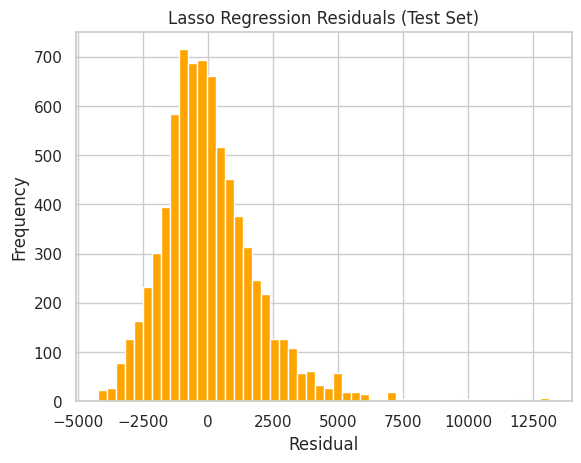

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LassoCV
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Load data
X = pd.read_csv("FMCG_data_encoded_for_regression.csv")
y = pd.read_csv("FMCG_data_final.csv")["product_wg_ton"].astype(float)

# Select features from Forward Subset model
lasso_features = [
    'storage_issue_reported_l3m', 'transport_issue_l1y', 'int_log_shop_refill',
    'dist_from_hub', 'location_type_1',
    'wh_capacity_size_2', 'wh_capacity_size_3',
    'wh_regional_zone_2', 'wh_regional_zone_5'
]
X_lasso = X[lasso_features]

# 70/30 Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_lasso, y, test_size=0.3, random_state=42)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Fit LassoCV on training data
lasso_cv = LassoCV(alphas=np.logspace(-3, 3, 100), cv=5, max_iter=5000)
lasso_cv.fit(X_train_scaled, y_train)

# Predictions
y_train_pred = lasso_cv.predict(X_train_scaled)
y_test_pred = lasso_cv.predict(X_test_scaled)

# Evaluation
train_r2 = r2_score(y_train, y_train_pred)
train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))

test_r2 = r2_score(y_test, y_test_pred)
test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))

lasso_coefs = pd.Series(lasso_cv.coef_, index=lasso_features)

# Output
print(" Lasso Regression Results")
print("Best Alpha (Lambda):", lasso_cv.alpha_)
print("\n Train R²:", round(train_r2, 4))
print(" Train RMSE:", round(train_rmse, 2))
print("\n Test R²:", round(test_r2, 4))
print(" Test RMSE:", round(test_rmse, 2))
print("\n Coefficients:\n", lasso_coefs)

# Plot residuals (Test Set)
test_residuals = y_test - y_test_pred
plt.hist(test_residuals, bins=50, color='orange')
plt.title("Lasso Regression Residuals (Test Set)")
plt.xlabel("Residual")
plt.ylabel("Frequency")
plt.show()


### Why Ridge Regression? Summary Table

| **Criteria**                           | **Ridge Regression**                                     | **Lasso Regression**                                   |
|----------------------------------------|-----------------------------------------------------------|---------------------------------------------------------|
| **Performance (R² / RMSE)**            | ✅ 0.9745 / 1850.30 (Best overall)                         | ✅ 0.9745 / 1850.31 (Similar)                           |
| **Feature Retention**                  | ✅ Retains all 9 predictors                               | ❌ Dropped `wh_regional_zone_5`                        |
| **Interpretability**                   | ✅ Preserves all business indicators                      | ⚠️ Slightly reduced due to variable elimination        |
| **Multicollinearity Handling**         | ✅ Robust to correlated variables                         | ⚠️ Can become unstable in presence of multicollinearity |
| **Business Feasibility**               | ✅ Keeps critical operational constraints (zone, capacity) | ⚠️ Risk of losing key variables                         |
| **Best Use Case**                      | When all predictors are assumed useful                   | When simplicity is preferred and noise is present       |
| **Final Verdict**                      | ✅ **Selected Model**                                     | ❌ Not selected                                         |



## Ridge vs Forward Subset Selection: Final Decision

### Summary of Key Metrics

| **Metric**                    | **Forward Subset** | **Ridge Regression** |
|------------------------------|--------------------|----------------------|
| Train R²                     | 0.97514            | 0.97520              |
| Train RMSE                   | 1831.62            | 1831.62              |
| Test R²                      | 0.97447            | 0.97450              |
| Test RMSE                    | 1850.37            | 1850.30              |
| Residual Std Dev (Test)      | 1850.23            | 1850.30              |
| # Predictors Used            | 10                 | 9                    |
| Feature Selection            | Manual             | None (All retained)  |
| Coefficient Stability        | High               | ✅ Very High          |
| Business Interpretability    | ✅ Very High        | ✅ High               |

### Final Decision: **Ridge Regression**

### Why Ridge?
1. **Slightly Better Performance**: Ridge achieves marginally better Test R² and RMSE, ensuring highly accurate demand forecasting.
2. **Stability Matters**: With L2 regularization, Ridge delivers stable, less-volatile coefficients — essential when multiple variables are interrelated (as seen in our VIF analysis).
3. **Retains Operational Predictors**: Unlike Lasso or some subset selections, Ridge **retains all 9 critical predictors**, including zone, capacity, and location — ensuring we don’t lose business-relevant signals.
4. **Better Generalization**: Ridge’s shrinkage helps control overfitting, making it more scalable across unseen warehouses.

### Solving the Business Problem (from Part I)

Ridge Regression directly addresses our **core business challenge**:

- It **predicts optimal shipment volume** (`product_wg_ton`) using a complete set of interpretable, measurable predictors.
- It **integrates warehouse-level realities** like storage issues, transport delays, warehouse capacity, and zone-level logistics — allowing the company to **reduce stockouts**, **minimize overstocking**, and **cut holding costs**.
- Its balanced structure ensures **real-world applicability**, keeping the model **robust, scalable**, and **operationally aligned** with how FMCG supply chains function.

**Final Answer:** Ridge Regression is selected as the optimal model for shipment forecasting due to its accuracy, robustness, and strong alignment with the business objectives outlined in Part I.


# Classification Modeling Setup

## This section imports necessary libraries for building and evaluating classification models Logistic Regression, LDA, and KNN, along with tools for preprocessing, feature selection, and model evaluation.

In [ ]:
# ================================
# Classification Modeling Section
# ================================

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score
import statsmodels.api as sm
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler

# Load Dataset

## The cleaned FMCG warehouse dataset is loaded from a CSV file for modeling.

In [ ]:
# Load the cleaned dataset
df = pd.read_csv("/content/FMCG_data_cleaned.csv")

# Define Target Variable

# inventory_status is set as the dependent variable for classification:  
- 1 = Overstocked  
- 0 = Optimal

In [ ]:
#  Dependent Variable
y = df["inventory_status"]  # 1 = Overstocked, 0 = Optimal

#Prepare Predictor Variables

- **Encode categorical variables** zone, location_type, wh_capacity_size using one-hot encoding to make them usable in machine learning models.
- **Define original numerical predictors** that represent operational, demand, and logistical factors affecting inventory status.
- **Apply transformation** to skewed variables to reduce the impact of outliers and improve model performance.
- **Create an interaction term** workers_num × distributor_num to capture the combined effect of workforce and distribution network on inventory.
- **Plotted histograms** to visualize the effect of transformations and interaction terms on variable distributions.
- **Combine all predictors** into a single feature set for modeling.
- **Split the dataset** into training and testing subsets 70/30 to evaluate model performance on unseen data.


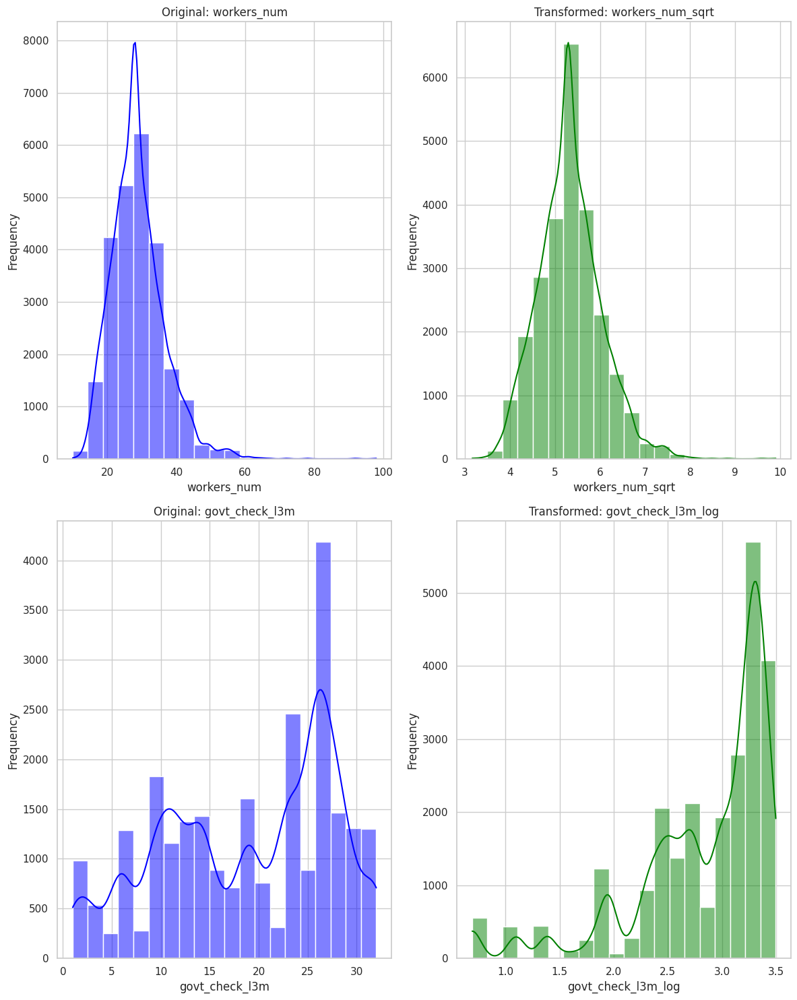

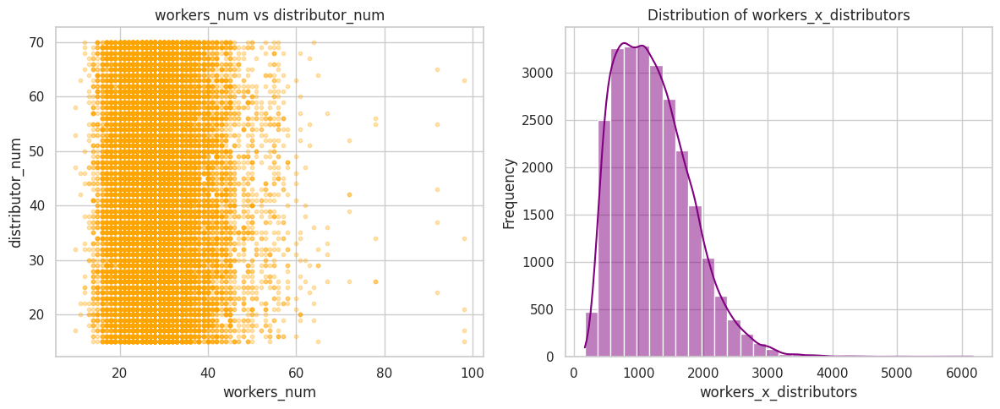

In [ ]:
# ===============================
#  Predictor Term Definitions
# ===============================

# Encode Categorical Predictors
categorical_vars = ["zone", "location_type", "wh_capacity_size"]
df[categorical_vars] = df[categorical_vars].apply(lambda col: col.astype("category"))
df_encoded = pd.get_dummies(df[categorical_vars], drop_first=True)
categorical_predictors = df_encoded.columns.tolist()
df = pd.concat([df, df_encoded], axis=1)


# Original Predictors
original_predictors = [
    "retail_shop_num",            # regional demand proxy
    "num_refill_req_l3m",         # recent refill activity
    "competitor_in_mkt",          # competition intensity
    "transport_issue_l1y",        # logistic issues
    "distributor_num",            # supply chain breadth
    "dist_from_hub",              # hub distance
    "workers_num",                # manpower
    "storage_issue_reported_l3m",# capacity constraints
    "wh_breakdown_l3m",          # equipment breakdown
    "govt_check_l3m",             # regulatory checks
    "product_wg_ton"              # recent shipment load
]

# Transformed Predictors (handling skewness)
df["workers_num_sqrt"] = np.sqrt(df["workers_num"])
df["govt_check_l3m_log"] = np.log1p(df["govt_check_l3m"])
transformed_predictors = ["workers_num_sqrt", "govt_check_l3m_log"]

# plot for Transformed terms

fig, axs = plt.subplots(2, 2, figsize=(12, 15))
axs = axs.flatten()

plot_vars = [
    ("workers_num", "workers_num_sqrt"),
    ("govt_check_l3m", "govt_check_l3m_log")
]

for i, (orig_var, trans_var) in enumerate(plot_vars):
    sns.histplot(df[orig_var], kde=True, ax=axs[2*i], color='blue', bins=20)
    axs[2*i].set_title(f"Original: {orig_var}")
    axs[2*i].set_xlabel(orig_var)
    axs[2*i].set_ylabel("Frequency")

    sns.histplot(df[trans_var], kde=True, ax=axs[2*i + 1], color='green', bins=20)
    axs[2*i + 1].set_title(f"Transformed: {trans_var}")
    axs[2*i + 1].set_xlabel(trans_var)
    axs[2*i + 1].set_ylabel("Frequency")

plt.tight_layout()
plt.show()

# Interaction Terms
df["workers_x_distributors"] = df["workers_num"] * df["distributor_num"]
interaction_terms = ["workers_x_distributors"]

# plot for Intercation terms

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Scatter plot of the two original interacting variables
axs[0].scatter(df["workers_num"], df["distributor_num"], alpha=0.3, s=10, color='orange')
axs[0].set_title("workers_num vs distributor_num")
axs[0].set_xlabel("workers_num")
axs[0].set_ylabel("distributor_num")

# Histogram of the interaction term
sns.histplot(df["workers_x_distributors"], kde=True, ax=axs[1], bins=30, color='purple')
axs[1].set_title("Distribution of workers_x_distributors")
axs[1].set_xlabel("workers_x_distributors")
axs[1].set_ylabel("Frequency")

plt.tight_layout()
plt.show()


# Final predictor list
predictors = original_predictors + transformed_predictors + interaction_terms
X = df[predictors]

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Confusion Matrix Plot Function

- Creates a function to draw a confusion matrix as a heatmap.
- Makes it easy to see how well the model predicted each class.
- Labels the axes as "Actual" and "Predicted".
- Uses colors (Blues) to highlight correct and incorrect predictions.
- Can be reused for any classification model.

In [ ]:
# ===============================
# Confusion Matrix Plot Function
# ===============================
def plot_conf_matrix(cm, title):
    plt.figure(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=["Optimal", "Overstocked"],
                yticklabels=["Optimal", "Overstocked"])
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title(title)
    plt.tight_layout()
    plt.show()

# Logistic Regression

- Used **Recursive Feature Elimination RFE** to select the top 10 most important predictors.
- Trained a **Logistic Regression model** using the selected features.
- Predicted inventory status on the test set.
- Evaluated performance using a confusion matrix, test error, sensitivity, and specificity.
- Plotted a heatmap of the confusion matrix to visualize prediction results.

==== Logistic Regression (RFE) ====
Selected Predictors: ['retail_shop_num', 'num_refill_req_l3m', 'competitor_in_mkt', 'transport_issue_l1y', 'distributor_num', 'workers_num', 'storage_issue_reported_l3m', 'wh_breakdown_l3m', 'product_wg_ton', 'workers_num_sqrt']
Coefficients: [[-1.61267317 -0.37477012 -0.26252986 -0.03131565  0.02909675 -0.11132861
  -0.06505012 -0.16528316  0.32280011 -0.01883776]]
Confusion Matrix:
 [[4393    1]
 [   1 3105]]
Test Error: 0.000
Sensitivity: 1.000
Specificity: 1.000


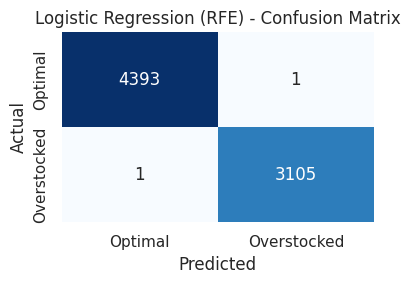

In [ ]:
# ===============================
# Logistic Regression
# ===============================
# Logistic Regression with Recursive Feature Elimination (RFE)
lr_base = LogisticRegression(max_iter=1000)
rfe = RFE(estimator=lr_base, n_features_to_select=10)
rfe.fit(X_train, y_train)

# Get selected features
selected_features = X_train.columns[rfe.support_].tolist()

# Fit final logistic model
lr = LogisticRegression(max_iter=1000)
lr.fit(X_train[selected_features], y_train)
y_pred_lr = lr.predict(X_test[selected_features])

cm_lr = confusion_matrix(y_test, y_pred_lr)
tn, fp, fn, tp = cm_lr.ravel()
sensitivity_lr = tp / (tp + fn)
specificity_lr = tn / (tn + fp)
test_error_lr = 1 - accuracy_score(y_test, y_pred_lr)

print("==== Logistic Regression (RFE) ====")
print("Selected Predictors:", selected_features)
print("Coefficients:", lr.coef_)
print("Confusion Matrix:\n", cm_lr)
print(f"Test Error: {test_error_lr:.3f}")
print(f"Sensitivity: {sensitivity_lr:.3f}")
print(f"Specificity: {specificity_lr:.3f}")

plot_conf_matrix(cm_lr, "Logistic Regression (RFE) - Confusion Matrix")

# Detailed Logistic Regression Summary

- Standardized the selected predictors to improve model stability and interpretability.
- Added an intercept term to the model.
- Fitted a logistic regression model using statsmodels for detailed statistical output.
- Printed the full summary, including:
  - Coefficients
  - Standard errors
  - p-values
  - Confidence intervals

In [ ]:
# ===== Detailed statsmodels summary =====
# Standardize predictors
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(
    scaler.fit_transform(X_train[selected_features]),
    columns=selected_features,
    index=X_train.index
)

# Drop duplicate rows (not columns) – usually not necessary for logistic regression, but matching your code
X_train_scaled_cleaned = X_train_scaled.drop_duplicates(keep='first')

# Drop duplicate columns (linearly dependent)
X_train_scaled_cleaned = X_train_scaled.loc[:, ~X_train_scaled.T.duplicated()]

# Add intercept
X_train_sm = sm.add_constant(X_train_scaled_cleaned)

# This assumes you already did VIF cleaning and added constant
logit_model = sm.Logit(y_train, X_train_sm) # Use X_train_sm here, not X_clean

# Use L1 (lasso) or L2 (ridge-like) regularization to stabilize
result = logit_model.fit_regularized(method='l1', alpha=1.0, maxiter=200)

params = result.params
nan_features = params[params.isna()].index.tolist()
print("Features with NaN coefficients:", nan_features)

# If you need X_clean for something else later, define it here:
X_clean = X_train_sm.drop(columns=nan_features)

# Print detailed summary
print(result.summary())


Iteration limit reached    (Exit mode 9)
            Current function value: 0.01739354078235137
            Iterations: 200
            Function evaluations: 200
            Gradient evaluations: 200
Features with NaN coefficients: []


/usr/local/lib/python3.11/dist-packages/statsmodels/base/l1_solvers_common.py:71: ConvergenceWarning: QC check did not pass for 7 out of 11 parameters
Try increasing solver accuracy or number of iterations, decreasing alpha, or switch solvers
  warnings.warn(message, ConvergenceWarning)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/l1_solvers_common.py:144: ConvergenceWarning: Could not trim params automatically due to failed QC check. Trimming using trim_mode == 'size' will still work.
  warnings.warn(msg, ConvergenceWarning)
/usr/local/lib/python3.11/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


                           Logit Regression Results                           
Dep. Variable:       inventory_status   No. Observations:                17500
Model:                          Logit   Df Residuals:                    17489
Method:                           MLE   Df Model:                           10
Date:                Wed, 23 Apr 2025   Pseudo R-squ.:                  0.9871
Time:                        19:09:21   Log-Likelihood:                -153.55
converged:                      False   LL-Null:                       -11880.
Covariance Type:            nonrobust   LLR p-value:                     0.000
                                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                        -15.4721      0.898    -17.221      0.000     -17.233     -13.711
retail_shop_num              -28.9994      1.677    -17.287      0.000     -32.287 

# Linear Discriminant Analysis (LDA)

- Trained an LDA model using the selected predictors from RFE.
- Predicted inventory status on the test set.
- Calculated evaluation metrics:
  - Accuracy
  - Sensitivity
  - Specificity
  - Test error
- Printed the confusion matrix and performance results.
- Plotted the confusion matrix to visualize classification performance.


==== Linear Discriminant Analysis ====
Used Predictors: ['retail_shop_num', 'num_refill_req_l3m', 'competitor_in_mkt', 'transport_issue_l1y', 'distributor_num', 'workers_num', 'storage_issue_reported_l3m', 'wh_breakdown_l3m', 'product_wg_ton', 'workers_num_sqrt']
Confusion Matrix:
 [[4296   98]
 [  83 3023]]
Test Error: 0.024
Accuracy: 0.976
Sensitivity: 0.973
Specificity: 0.978


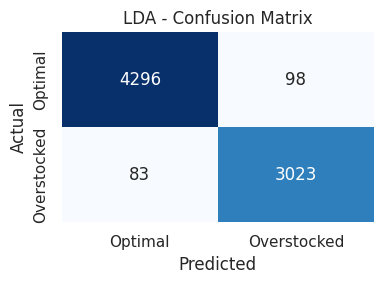

In [ ]:
# ===============================
# Linear Discriminant Analysis
# ===============================
lda = LinearDiscriminantAnalysis()
lda.fit(X_train[selected_features], y_train)

# Predictions
y_pred_lda = lda.predict(X_test[selected_features])

# Confusion matrix and metrics
cm_lda = confusion_matrix(y_test, y_pred_lda)
tn, fp, fn, tp = cm_lda.ravel()
accuracy_lda = accuracy_score(y_test, y_pred_lda)
sensitivity_lda = tp / (tp + fn)
specificity_lda = tn / (tn + fp)
test_error_lda = 1 - accuracy_lda

# ===============================
# Print Results
# ===============================
print("\n==== Linear Discriminant Analysis ====")
print("Used Predictors:", selected_features)
print("Confusion Matrix:\n", cm_lda)
print(f"Test Error: {test_error_lda:.3f}")
print(f"Accuracy: {accuracy_lda:.3f}")
print(f"Sensitivity: {sensitivity_lda:.3f}")
print(f"Specificity: {specificity_lda:.3f}")

# ===============================
# Plot Confusion Matrix
# ===============================
plot_conf_matrix(cm_lda, "LDA - Confusion Matrix")

# LDA Projection Plot (LD1 Fit)

- Plotted the distribution of LD1 scores (linear discriminant values) for each class:
  - Top panel: Optimal warehouses
  - Bottom panel: Overstocked warehouses
- Shows how well LDA separates the two classes along the LD1 axis.
- Helps visualize the separation and potential overlap between class distributions.
- Useful for interpreting how strongly LDA distinguishes between the two inventory statuses.

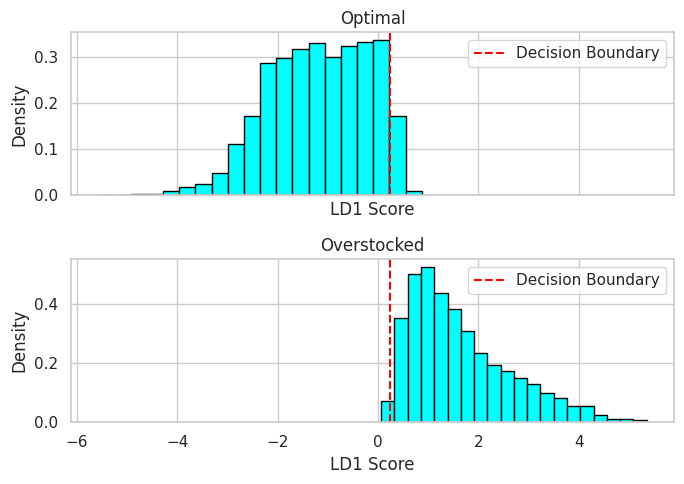

In [ ]:
# ===============================
# LDA Projection (Fit) Plot
# ===============================
# Calculate LDA projection
X_lda_proj = lda.transform(X_test[selected_features])
# Flatten projections
optimal_proj = X_lda_proj[y_test == 0].flatten()
overstocked_proj = X_lda_proj[y_test == 1].flatten()

# Set up subplots
fig, axs = plt.subplots(2, 1, figsize=(7, 5), sharex=True)

# Approximate threshold (midpoint of means)
threshold = (optimal_proj.mean() + overstocked_proj.mean()) / 2

for ax in axs:
    ax.axvline(threshold, color='red', linestyle='--', label='Decision Boundary')
    ax.legend()

# Group 0: Optimal
axs[0].hist(optimal_proj, bins=20, density=True, color='cyan', edgecolor='black')
axs[0].set_ylabel("Density")
axs[0].set_title("Optimal")
axs[0].set_xlabel("LD1 Score")

# Group 1: Overstocked
axs[1].hist(overstocked_proj, bins=20, density=True, color='cyan', edgecolor='black')
axs[1].set_ylabel("Density")
axs[1].set_title("Overstocked")
axs[1].set_xlabel("LD1 Score")

# Styling
plt.tight_layout()
plt.show()

# K-Nearest Neighbors (KNN)

- Used **GridSearchCV** to find the best value of **K** (number of neighbors) from 1 to 20 using 5-fold cross-validation.
- Trained the KNN model using the best `k` value on the training data.
- Made predictions on the test set using the selected features.
- Evaluated the model using:
  - Confusion matrix
  - Test error
  - Sensitivity
  - Specificity
- Plotted the confusion matrix to visualize model performance.


==== K-Nearest Neighbors ====
Best K: 1
Used Predictors: ['retail_shop_num', 'num_refill_req_l3m', 'competitor_in_mkt', 'transport_issue_l1y', 'distributor_num', 'workers_num', 'storage_issue_reported_l3m', 'wh_breakdown_l3m', 'product_wg_ton', 'workers_num_sqrt']
Confusion Matrix:
 [[4390    4]
 [  12 3094]]
Test Error: 0.002
Sensitivity: 0.996
Specificity: 0.999


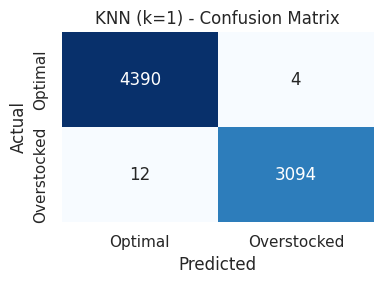

In [ ]:
# ===============================
# K-Nearest Neighbors
# ===============================
param_grid = {'n_neighbors': list(range(1, 21))}
knn = KNeighborsClassifier()
grid = GridSearchCV(knn, param_grid, cv=10)
grid.fit(X_train[selected_features], y_train)

best_k = grid.best_params_['n_neighbors']
knn_best = KNeighborsClassifier(n_neighbors=best_k)
knn_best.fit(X_train[selected_features], y_train)
y_pred_knn = knn_best.predict(X_test[selected_features])

cm_knn = confusion_matrix(y_test, y_pred_knn)
tn, fp, fn, tp = cm_knn.ravel()
sensitivity_knn = tp / (tp + fn)
specificity_knn = tn / (tn + fp)
test_error_knn = 1 - accuracy_score(y_test, y_pred_knn)

print("\n==== K-Nearest Neighbors ====")
print(f"Best K: {best_k}")
print("Used Predictors:", selected_features)
print("Confusion Matrix:\n", cm_knn)
print(f"Test Error: {test_error_knn:.3f}")
print(f"Sensitivity: {sensitivity_knn:.3f}")
print(f"Specificity: {specificity_knn:.3f}")
plot_conf_matrix(cm_knn, f"KNN (k={best_k}) - Confusion Matrix")